In [45]:
import yt
from yt import derived_field

import trident

import numpy as np 

from astropy.table import Table
import astropy.units as u

from consistency import *
from get_halo_center import get_halo_center
from get_proper_box_size import get_proper_box_size
from modular_plots import get_refine_box

import seaborn as sns
sns.set_style("whitegrid", {'axes.grid' : False})
import matplotlib as mpl
mpl.rcParams['font.family'] = 'stixgeneral'
import matplotlib.pyplot as plt


In [46]:
%matplotlib notebook

In [4]:
ds = yt.load("/Users/molly/foggie/halo_008508/nref11n/natural/RD0020/RD0020")
# ds = yt.load("/astro/simulations/FOGGIE/halo_008508/nref11n_selfshield_z15/natural/RD0013/RD0013")
# trident.add_ion_fields(ds, ions=['C IV', 'O VI', 'H I', 'Si II', 'C II', 'Si III'])


yt : [INFO     ] 2018-06-19 17:44:52,972 Parameters: current_time              = 154.801187733
yt : [INFO     ] 2018-06-19 17:44:52,973 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2018-06-19 17:44:52,974 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2018-06-19 17:44:52,976 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2018-06-19 17:44:52,978 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2018-06-19 17:44:52,979 Parameters: current_redshift          = 1.99999762534
yt : [INFO     ] 2018-06-19 17:44:52,980 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2018-06-19 17:44:52,982 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2018-06-19 17:44:52,983 Parameters: hubble_constant           = 0.695


In [5]:
width = default_width
track_name = "/Users/molly/foggie/halo_008508/nref11n/nref11n_nref10f_refine200kpc/halo_track"
#track_name = "/astro/simulations/FOGGIE/halo_008508/nref11n/nref11n_nref10f_refine200kpc/halo_track"
track = Table.read(track_name, format='ascii')
track.sort('col1')
zsnap = ds.get_parameter('CosmologyCurrentRedshift')
proper_box_size = get_proper_box_size(ds)

refine_box, refine_box_center, refine_width = get_refine_box(ds, zsnap, track)
refine_width = refine_width * proper_box_size

# center is trying to be the center of the halo
center, velocity = get_halo_center(ds, refine_box_center)
width_code = width / proper_box_size ## needs to be in code units
box = ds.r[center[0] - 0.5*width_code : center[0] + 0.5*width_code, \
           center[1] - 0.5*width_code : center[1] + 0.5*width_code, \
           center[2] - 0.5*width_code : center[2] + 0.5*width_code]


Parsing Hierarchy : 100%|██████████| 1449/1449 [00:00<00:00, 11021.19it/s]

('using this loc:', <Table length=1>
   col1     col2     col3     col4     col5     col6     col7    col8
 float64  float64  float64  float64  float64  float64  float64  int64
--------- -------- -------- -------- -------- -------- -------- -----
1.9999999 0.493032 0.487924 0.501169 0.495032 0.489924 0.503169    10)



yt : [INFO     ] 2018-06-19 17:44:58,085 Gathering a field list (this may take a moment.)


We have located the main halo at : [0.4940328598022461, 0.4889516830444336, 0.5021543502807617]


In [5]:
discrete_cmap = mpl.colors.ListedColormap(['#565656','#4daf4a',"#d73027","#984ea3","#ffe34d",'#4575b4','darkorange'])
#discrete_cmap = mpl.colors.ListedColormap(["#4575b4","#d73027","#984ea3","#ffe34d",'#4daf4a','darkorange'])
#discrete_cmap = mpl.colors.ListedColormap(["#4575b4","#d73027","#ffe34d",'#4daf4a','darkorange'])


yt : [INFO     ] 2018-03-09 10:54:07,554 xlim = 0.500695 0.503614
yt : [INFO     ] 2018-03-09 10:54:07,555 ylim = 0.492573 0.495492
yt : [INFO     ] 2018-03-09 10:54:07,557 xlim = 0.500695 0.503614
yt : [INFO     ] 2018-03-09 10:54:07,558 ylim = 0.492573 0.495492
yt : [INFO     ] 2018-03-09 10:54:07,560 Making a fixed resolution buffer of (('gas', 'dy')) 800 by 800
yt : [INFO     ] 2018-03-09 10:54:08,303 Saving plot nref11n_rd0020_cellsize.pdf



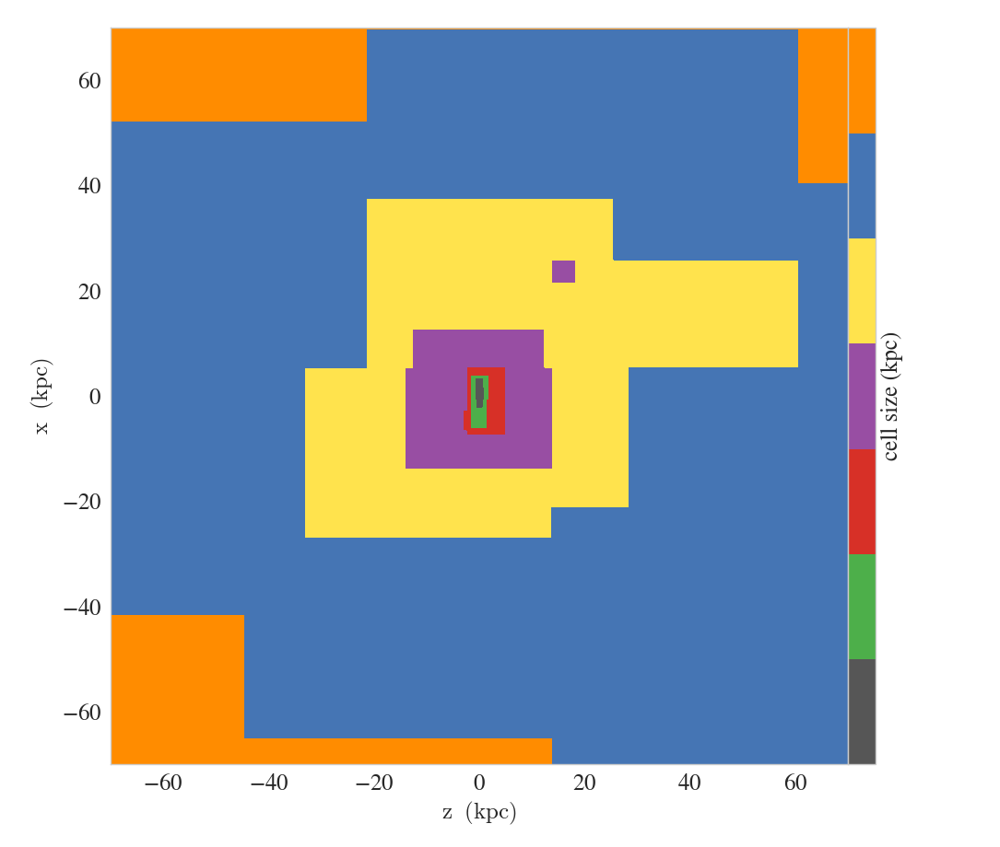

In [7]:
#s = yt.SlicePlot(ds, "y", ('index','grid_level'), center=center, width=(1.5*width,'kpc'))
s = yt.SlicePlot(ds, "y", 'dy', center=center, width=(2*width,'kpc'))
# s.set_cmap(('index','grid_level'),"tab20b")
s.set_cmap('dy', discrete_cmap)
s.set_unit('dy','kpc')
#s.set_cmap(('index','grid_level'), discrete_cmap)
#s.set_zlim(('index','grid_level'),6,11)
plot = s.plots['dy']
s._setup_plots()
colorbar = plot.cb
colorbar.set_ticks([0.093, 2*0.093, 4*0.093, 8*0.093, 16*0.093])
colorbar.set_ticklabels([0.093, 0.186, 0.374, 0.748, 1.496])
#colorbar.set_ticks([1e0])
#colorbar.set_ticklabels(['test'])
colorbar.set_label('cell size (kpc)')
s.save('nref11n_rd0020_cellsize.pdf')
s.show()

yt : [INFO     ] 2018-03-01 14:45:21,239 xlim = 0.500695 0.503614
yt : [INFO     ] 2018-03-01 14:45:21,240 ylim = 0.492573 0.495492
yt : [INFO     ] 2018-03-01 14:45:21,243 xlim = 0.500695 0.503614
yt : [INFO     ] 2018-03-01 14:45:21,245 ylim = 0.492573 0.495492
yt : [INFO     ] 2018-03-01 14:45:21,247 Making a fixed resolution buffer of (('gas', 'dy')) 800 by 800
yt : [INFO     ] 2018-03-01 14:45:21,887 Saving plot nref11n_nref10f_rd0020_cellsize.pdf



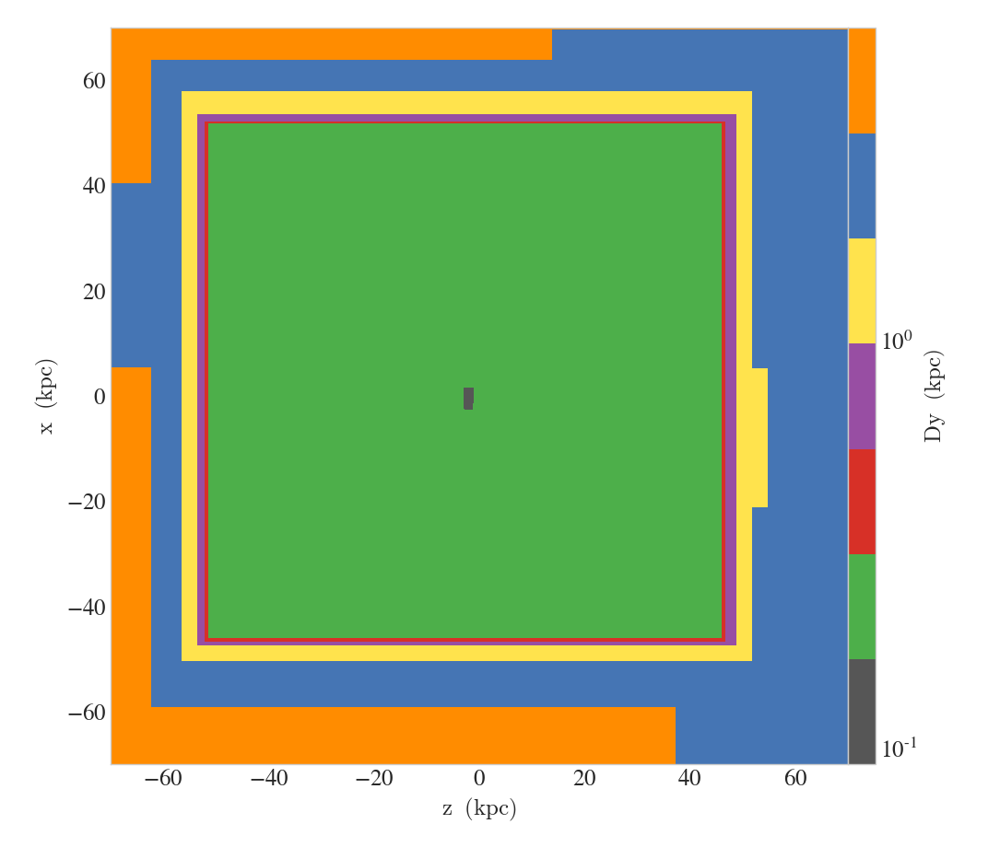

In [52]:
sr = yt.SlicePlot(dsr, "y", 'dy', center=center, width=(2*width,'kpc'))
sr.set_cmap('dy', discrete_cmap)
sr.set_unit('dy','kpc')
colorbar.set_label('cell size (kpc)')
sr.save('nref11n_nref10f_rd0020_cellsize.pdf')
sr.show()

yt : [INFO     ] 2018-01-25 10:44:58,380 Projection completed
yt : [INFO     ] 2018-01-25 10:44:58,381 xlim = 0.488430 0.489473
yt : [INFO     ] 2018-01-25 10:44:58,382 ylim = 0.501633 0.502676
yt : [INFO     ] 2018-01-25 10:44:58,383 xlim = 0.488430 0.489473
yt : [INFO     ] 2018-01-25 10:44:58,384 ylim = 0.501633 0.502676
yt : [INFO     ] 2018-01-25 10:44:58,386 Making a fixed resolution buffer of (('gas', 'Si_p1_ion_fraction')) 800 by 800



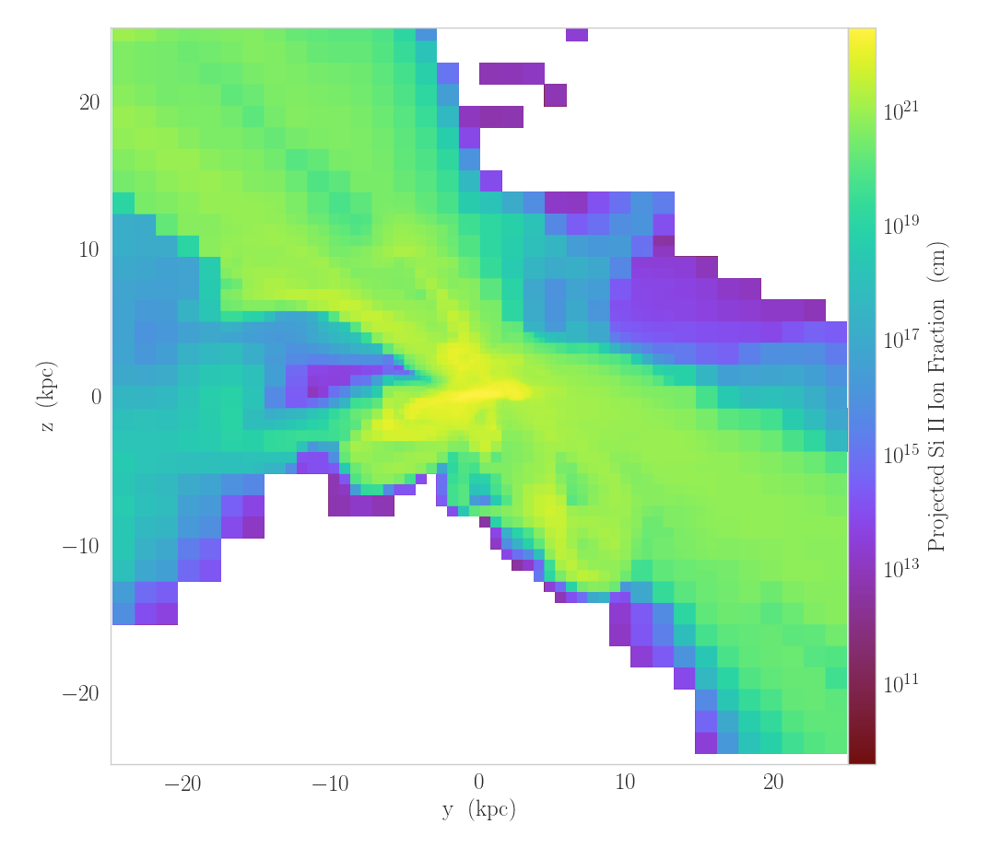

In [24]:
ax = "x"
p = yt.ProjectionPlot(ds, ax, 'Si_p1_ion_fraction', center=center, data_source=box, width=(width,'kpc'))
p.show()

yt : [INFO     ] 2018-01-25 10:12:34,526 xlim = 0.488430 0.489473
yt : [INFO     ] 2018-01-25 10:12:34,527 ylim = 0.501633 0.502676
yt : [INFO     ] 2018-01-25 10:12:34,529 xlim = 0.488430 0.489473
yt : [INFO     ] 2018-01-25 10:12:34,529 ylim = 0.501633 0.502676
yt : [INFO     ] 2018-01-25 10:12:34,532 Making a fixed resolution buffer of (('gas', 'Si_p1_ion_fraction')) 800 by 800



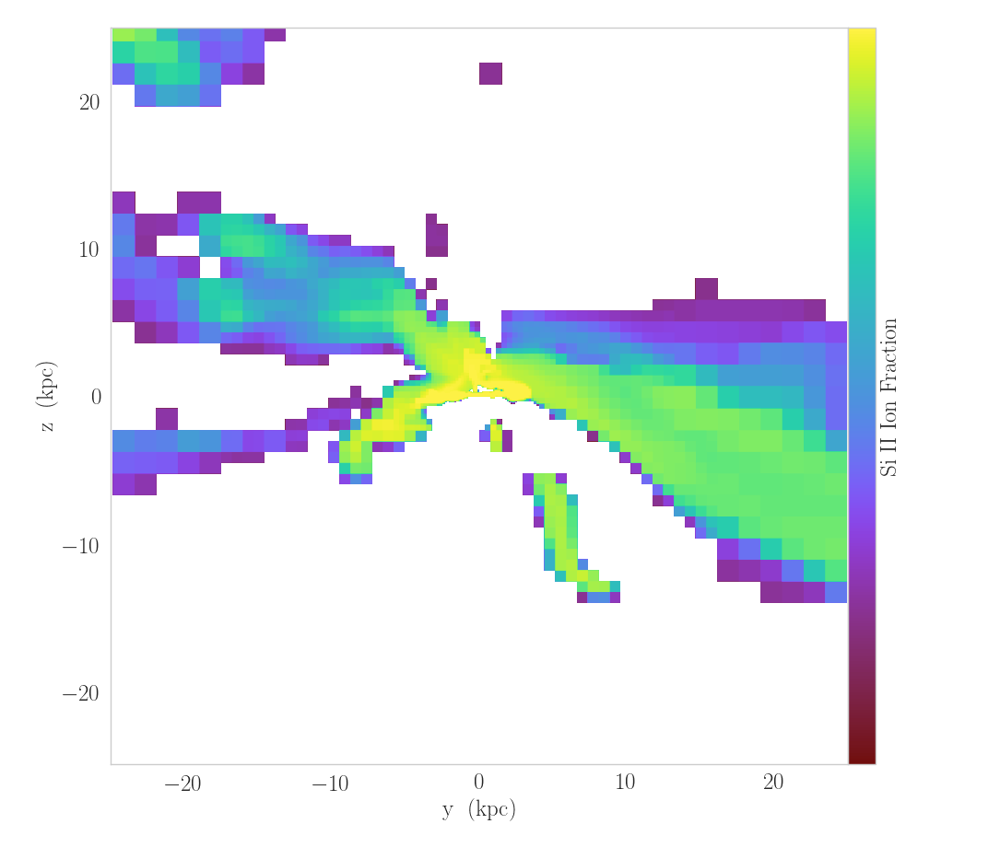

In [23]:
ax = "x"
s = yt.SlicePlot(ds, ax, 'Si_p1_ion_fraction', center=center, data_source=box, width=(width,'kpc'))
s.show()

In [92]:
dsr = yt.load("/Users/molly/foggie/halo_008508/nref11n/nref11n_nref10f_refine200kpc/RD0020/RD0020")
# dsr = yt.load("/astro/simulations/FOGGIE/halo_008508/nref11n/nref11n_nref10f_refine200kpc/RD0020/RD0020")
trident.add_ion_fields(dsr, ions=['C IV', 'O VI','Si II', 'C II', 'Si III'])

zsnap = dsr.current_redshift

refine_box, refine_box_center, refine_width = get_refine_box(dsr, zsnap, track)
refine_width = refine_width * proper_box_size

# center is trying to be the center of the halo
centerr, velocity = get_halo_center(dsr, refine_box_center)
width_code = width / proper_box_size ## needs to be in code units
boxr = dsr.r[centerr[0] - 0.5*width_code : centerr[0] + 0.5*width_code, \
           centerr[1] - 0.5*width_code : centerr[1] + 0.5*width_code, \
           centerr[2] - 0.5*width_code : centerr[2] + 0.5*width_code]


dsn = yt.load("/Users/molly/foggie/halo_008508/nref11n/natural/RD0020/RD0020")
# dsn = yt.load("/astro/simulations/FOGGIE/halo_008508/nref11n/natural/RD0020/RD0020")
trident.add_ion_fields(dsn, ions=['C IV', 'O VI', 'Si II', 'C II', 'Si III'])

refine_box_natural, refine_box_center, refine_width = get_refine_box(dsn, zsnap, track)
refine_width = refine_width * proper_box_size

# center is trying to be the center of the halo
center, velocity = get_halo_center(dsn, refine_box_center)
width_code = width / proper_box_size ## needs to be in code units
boxn = dsn.r[center[0] - 0.5*width_code : center[0] + 0.5*width_code, \
           center[1] - 0.5*width_code : center[1] + 0.5*width_code, \
           center[2] - 0.5*width_code : center[2] + 0.5*width_code]


yt : [INFO     ] 2018-06-23 14:14:03,588 Parameters: current_time              = 154.801032717
yt : [INFO     ] 2018-06-23 14:14:03,589 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2018-06-23 14:14:03,591 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2018-06-23 14:14:03,592 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2018-06-23 14:14:03,594 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2018-06-23 14:14:03,595 Parameters: current_redshift          = 1.99999968795
yt : [INFO     ] 2018-06-23 14:14:03,597 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2018-06-23 14:14:03,598 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2018-06-23 14:14:03,599 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 4574/4574 [00:00<00:00, 28606.84it/s]
yt : [INFO     ] 2018-06-23 14:14:04,317 Gathering a field list (this may take a moment.)


('using this loc:', <Table length=1>
   col1     col2     col3     col4     col5     col6     col7    col8
 float64  float64  float64  float64  float64  float64  float64  int64
--------- -------- -------- -------- -------- -------- -------- -----
2.0499999 0.493091 0.488119 0.501099 0.495091 0.490119 0.503099    10)
We have located the main halo at : [0.4940309524536133, 0.48897266387939453, 0.5021486282348633]


yt : [INFO     ] 2018-06-23 14:14:42,428 Parameters: current_time              = 154.801187733
yt : [INFO     ] 2018-06-23 14:14:42,430 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2018-06-23 14:14:42,432 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2018-06-23 14:14:42,434 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2018-06-23 14:14:42,436 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2018-06-23 14:14:42,437 Parameters: current_redshift          = 1.99999762534
yt : [INFO     ] 2018-06-23 14:14:42,439 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2018-06-23 14:14:42,440 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2018-06-23 14:14:42,442 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 1449/1449 [00:00<00:00, 5550.06it/s]
yt : [INFO     ] 2018-06-23 14:14:42,807 Gathering a field list (this may take a moment.)


('using this loc:', <Table length=1>
   col1     col2     col3     col4     col5     col6     col7    col8
 float64  float64  float64  float64  float64  float64  float64  int64
--------- -------- -------- -------- -------- -------- -------- -----
2.0499999 0.493091 0.488119 0.501099 0.495091 0.490119 0.503099    10)
We have located the main halo at : [0.4940328598022461, 0.4889516830444336, 0.5021543502807617]


yt : [INFO     ] 2018-01-25 10:49:46,838 Projection completed
yt : [INFO     ] 2018-01-25 10:49:46,839 xlim = 0.488451 0.489494
yt : [INFO     ] 2018-01-25 10:49:46,840 ylim = 0.501627 0.502670
yt : [INFO     ] 2018-01-25 10:49:46,841 xlim = 0.488451 0.489494
yt : [INFO     ] 2018-01-25 10:49:46,843 ylim = 0.501627 0.502670
yt : [INFO     ] 2018-01-25 10:49:46,844 Making a fixed resolution buffer of (('gas', 'Si_p1_ion_fraction')) 800 by 800



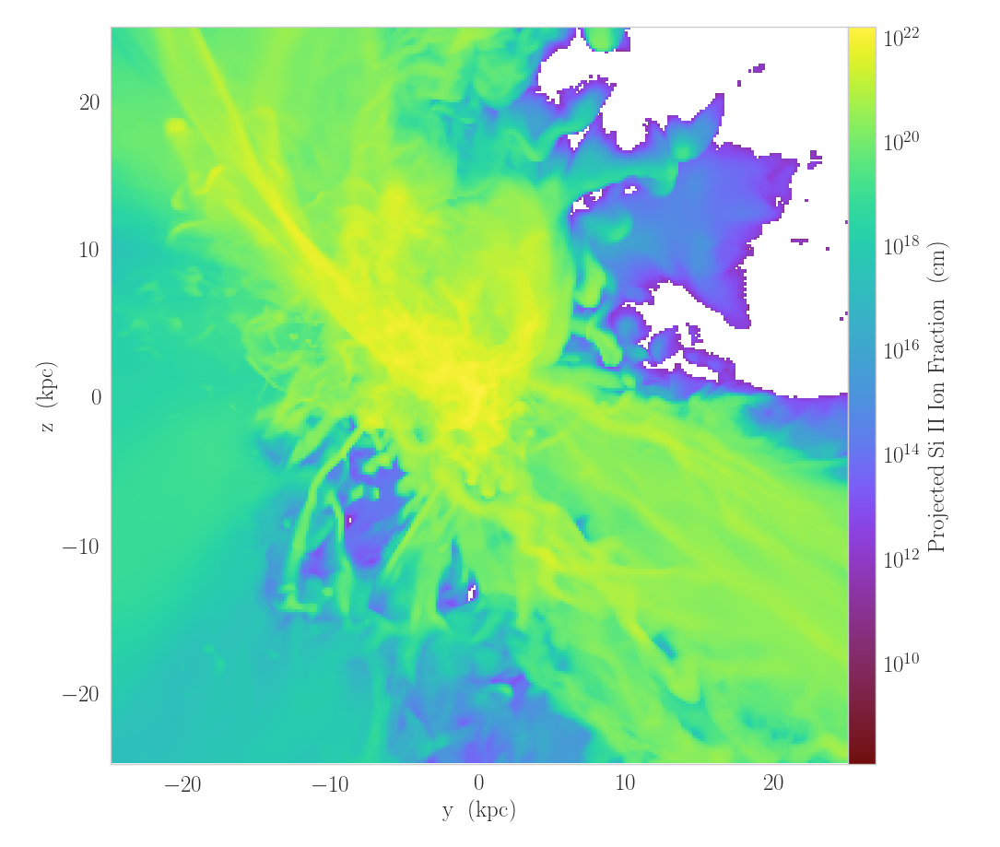

In [28]:
p = yt.ProjectionPlot(dsr, ax, 'Si_p1_ion_fraction', center=center, data_source=box, width=(width,'kpc'))
p.show()

yt : [INFO     ] 2018-01-25 11:01:10,922 xlim = 0.488451 0.489494
yt : [INFO     ] 2018-01-25 11:01:10,923 ylim = 0.501627 0.502670
yt : [INFO     ] 2018-01-25 11:01:10,925 xlim = 0.488451 0.489494
yt : [INFO     ] 2018-01-25 11:01:10,926 ylim = 0.501627 0.502670
yt : [INFO     ] 2018-01-25 11:01:10,928 Making a fixed resolution buffer of (('gas', 'O_p5_ion_fraction')) 800 by 800



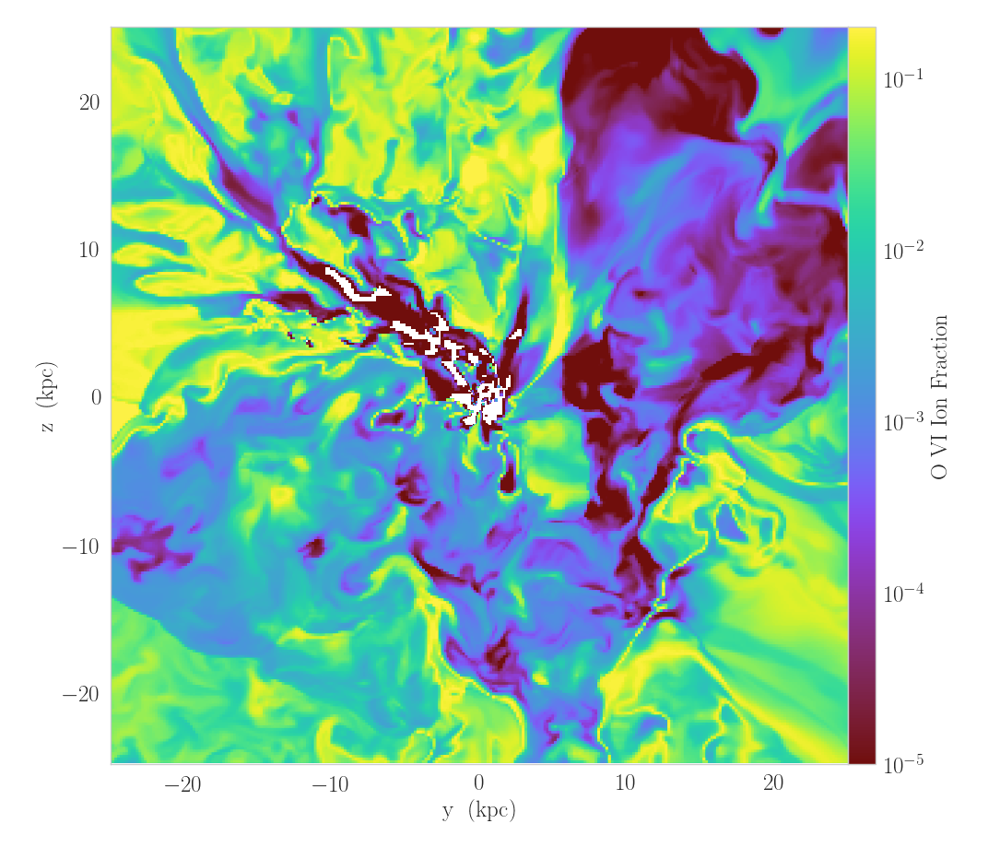

In [32]:
s = yt.SlicePlot(dsr, ax, 'O_p5_ion_fraction', center=center, data_source=box, width=(width,'kpc'))
s.set_zlim("O_p5_ion_fraction", 1.e-5,0.2)
s.show()

yt : [INFO     ] 2018-04-09 11:55:10,947 xlim = 0.488530 0.489416
yt : [INFO     ] 2018-04-09 11:55:10,949 ylim = 0.501706 0.502592
yt : [INFO     ] 2018-04-09 11:55:10,951 xlim = 0.488530 0.489416
yt : [INFO     ] 2018-04-09 11:55:10,952 ylim = 0.501706 0.502592
yt : [INFO     ] 2018-04-09 11:55:10,954 Making a fixed resolution buffer of (('gas', 'pressure')) 800 by 800



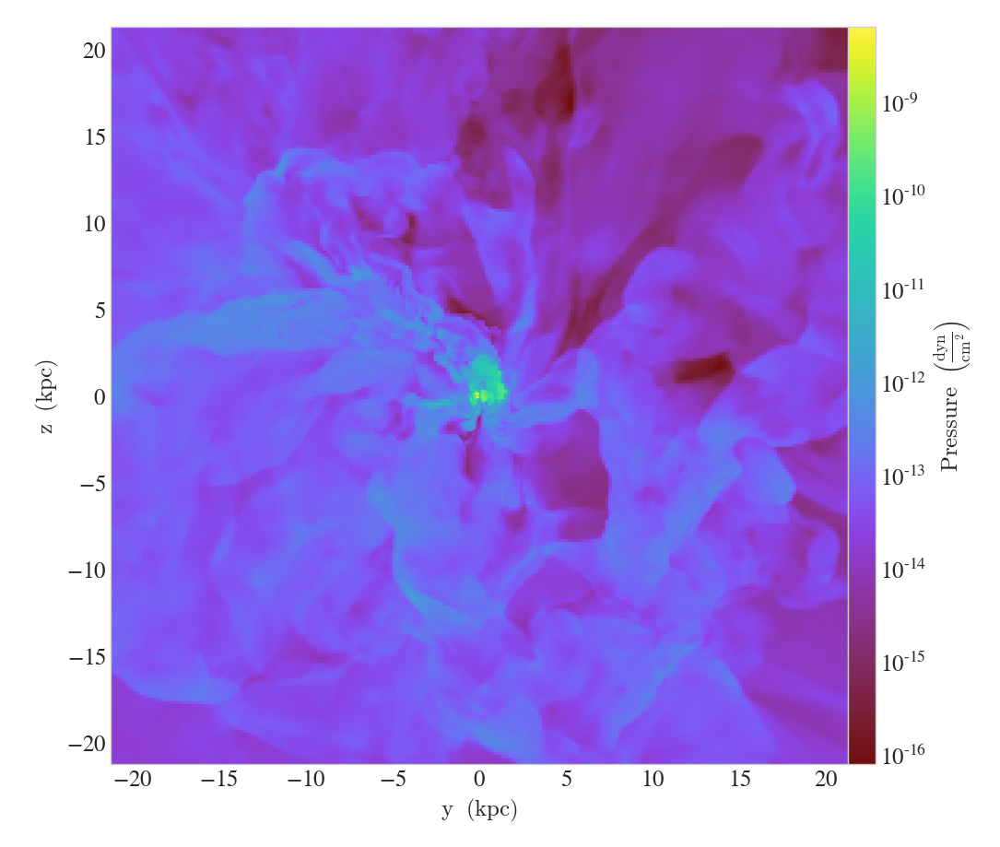

In [15]:
s = yt.SlicePlot(dsr, 'x', 'pressure', center=centerr, data_source=boxr, width=(0.5*width,'kpc'))
#s.set_zlim("O_p5_ion_fraction", 1.e-5,0.2)
s.show()

In [ ]:
s = yt.SlicePlot(dsr, ax, 'O_p5_ion_fraction', center=center, data_source=box, width=(width,'kpc'))
s.set_zlim("O_p5_ion_fraction", 1.e-5,0.2)
s.show()

In [ ]:
s = yt.SlicePlot(dsr, ax, 'temperature',weight_field='Si_p1_ion_fraction', center=center, data_source=box, width=(width,'kpc'))
#s.set_zlim("Si_p1_ion_fraction", 1.e-6,0.5)
s.set_zlim('temperature,4,6.5)
s.show()

In [ ]:
s = yt.SlicePlot(dsr, ax, 'temperature',weight_field='O_p5_ion_fraction', center=center, data_source=box, width=(width,'kpc'))
#s.set_zlim("Si_p1_ion_fraction", 1.e-6,0.5)
s.set_zlim('temperature,4,6.5)
s.show()

In [38]:
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib notebookos.system("$USER")

32512

In [39]:
import getpass
username = getpass. getuser() 

In [41]:

import socket
hostname = socket.gethostname()
print hostname

dhumuha-2.local


In [56]:
box['metallicity'].value

array([ 1.37091951,  1.35394464,  1.10111334, ...,  1.00222207,
        0.9556379 ,  0.87109234])

-6.93817625479 1.1224975883


<IPython.core.display.Javascript object>


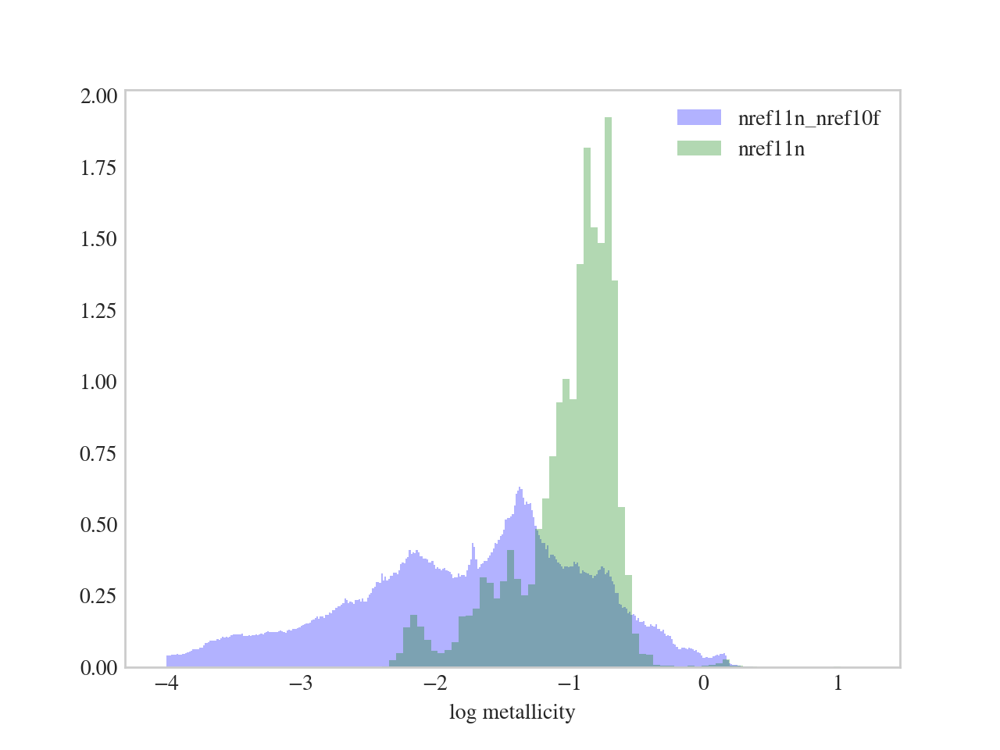

Text(0.5,0,u'log metallicity')

In [78]:
cooling_timer = boxr['cooling_time'].in_units('Myr')
cooling_timer = np.log10(cooling_timer)
cell_massr = boxr['cell_mass'].in_units('Msun')
cooling_lengthr = boxr['cooling_time']*boxr['sound_speed']
cell_sizer = boxr['dx'].in_units('kpc')
volumer = cell_sizer**3
ratior = cooling_lengthr / cell_sizer
cooling_lengthr = np.log10(cooling_lengthr.in_units('kpc'))
metallicityr = np.log10(boxr['metallicity'].value)
print np.min(metallicityr), np.max(metallicityr)
h1densr = boxr['H_p0_number_density']
idxr = np.where(boxr['H_nuclei_density'] < 0.1)[0]
# plt.hist(np.log(ratio[idx]),normed=True,bins=100,alpha=0.3,range=(-4,12),
#         color="blue",weights=cell_mass[idx])

cooling_timen = boxn['cooling_time'].in_units('Myr')
cooling_timen = np.log10(cooling_timen)
cell_massn = boxn['cell_mass'].in_units('Msun')
cooling_lengthn = boxn['cooling_time']*boxn['sound_speed']
cell_sizen = boxn['dx'].in_units('kpc')
volumen = cell_sizen**3
ration = cooling_lengthn / cell_sizen
cooling_lengthn = np.log10(cooling_lengthn.in_units('kpc'))
metallicityn = np.log10(boxr['metallicity'].value)
h1densn = boxn['H_p0_number_density']
idxn = np.where(boxn['H_nuclei_density'] < 0.1)[0]
# plt.hist(np.log(ratio[idx]),normed=True,bins=100,alpha=0.3,range=(-4,12),
#         color="blue",weights=cell_mass[idx])


plt.hist(metallicityr[idxr], normed=True, bins=400, alpha=0.3, color='blue', weights=cell_massr[idxr], range=(-4,1.2), label="nref11n_nref10f")
plt.hist(metallicityn[idxn], normed=True, bins=100, alpha=0.3, color='green', weights=cell_massn[idxn], label="nref11n")
plt.legend()
plt.xlabel("log metallicity")

<IPython.core.display.Javascript object>


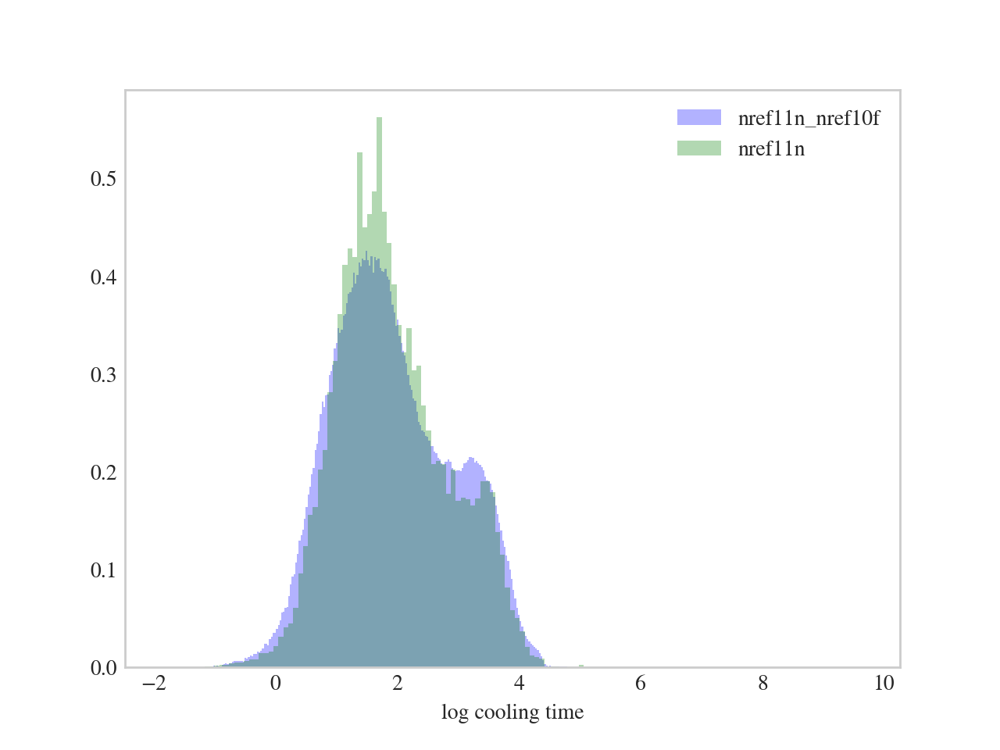

Text(0.5,0,u'log cooling time')

In [114]:
plt.hist(cooling_timer[idxr], normed=True, bins=400, alpha=0.3, color='blue', weights=cell_massr[idxr], label="nref11n_nref10f")
plt.hist(cooling_timen[idxn], normed=True, bins=100, alpha=0.3, color='green', weights=cell_massn[idxn], label="nref11n")
plt.legend()
plt.xlabel("log cooling time")

yt : [INFO     ] 2018-02-20 08:29:48,394 Projection completed
yt : [INFO     ] 2018-02-20 08:29:48,396 xlim = 0.488451 0.489494
yt : [INFO     ] 2018-02-20 08:29:48,397 ylim = 0.501627 0.502670
yt : [INFO     ] 2018-02-20 08:29:48,400 xlim = 0.488451 0.489494
yt : [INFO     ] 2018-02-20 08:29:48,402 ylim = 0.501627 0.502670
yt : [INFO     ] 2018-02-20 08:29:48,404 Making a fixed resolution buffer of (('gas', 'metallicity')) 800 by 800



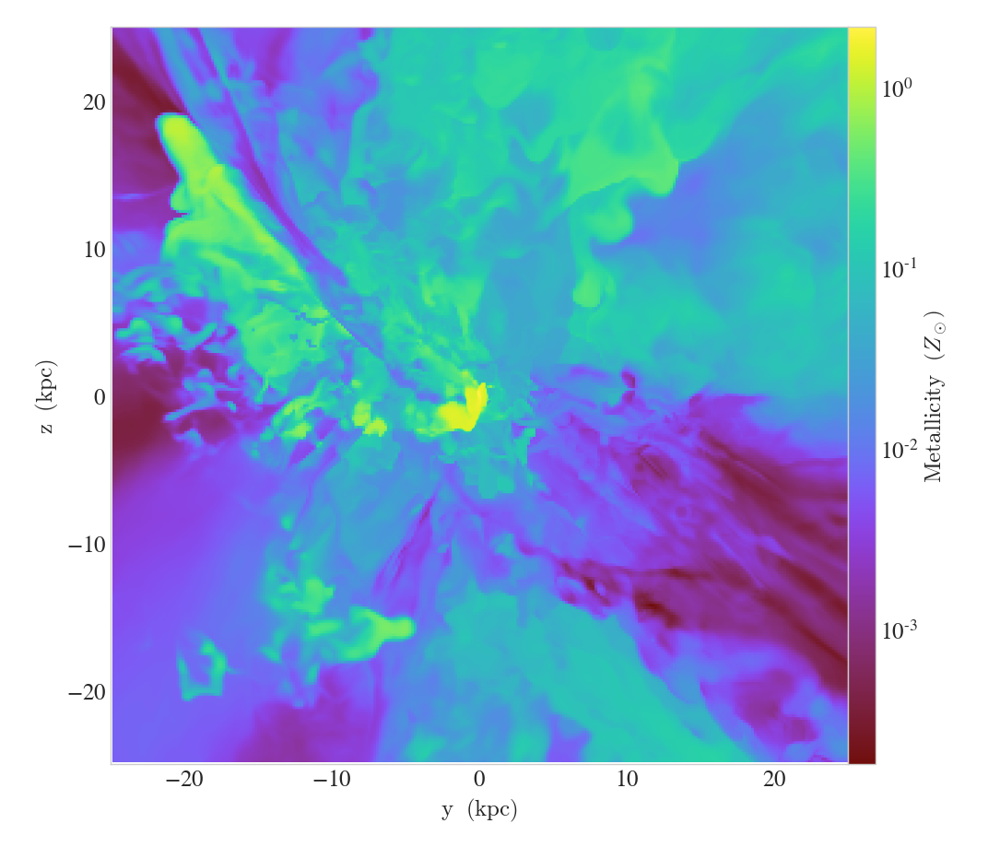

In [86]:
p = yt.ProjectionPlot(dsr, "x", 'metallicity', weight_field='H_p0_number_density', center=centerr, data_source=boxr, width=(width,'kpc'))
p.show()

yt : [INFO     ] 2018-02-20 08:30:01,481 Projection completed
yt : [INFO     ] 2018-02-20 08:30:01,482 xlim = 0.488451 0.489494
yt : [INFO     ] 2018-02-20 08:30:01,484 ylim = 0.501627 0.502670
yt : [INFO     ] 2018-02-20 08:30:01,486 xlim = 0.488451 0.489494
yt : [INFO     ] 2018-02-20 08:30:01,487 ylim = 0.501627 0.502670
yt : [INFO     ] 2018-02-20 08:30:01,489 Making a fixed resolution buffer of (('gas', 'metallicity')) 800 by 800



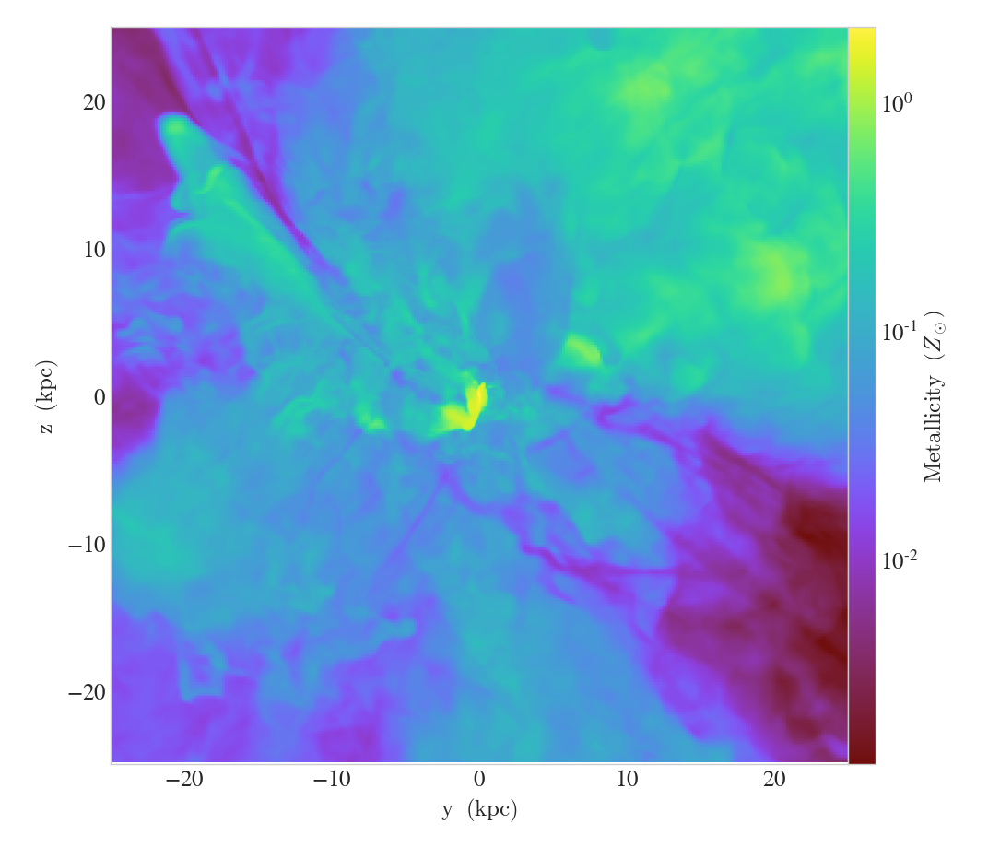

In [87]:
p = yt.ProjectionPlot(dsn, "x", 'metallicity', weight_field='density', center=centerr, data_source=boxr, width=(width,'kpc'))
p.show()

yt : [INFO     ] 2018-02-28 14:40:12,899 xlim = 0.493512 0.494554
yt : [INFO     ] 2018-02-28 14:40:12,901 ylim = 0.488430 0.489473
yt : [INFO     ] 2018-02-28 14:40:12,903 xlim = 0.493512 0.494554
yt : [INFO     ] 2018-02-28 14:40:12,904 ylim = 0.488430 0.489473
yt : [INFO     ] 2018-02-28 14:40:12,906 Making a fixed resolution buffer of (('gas', 'cooling_time')) 800 by 800



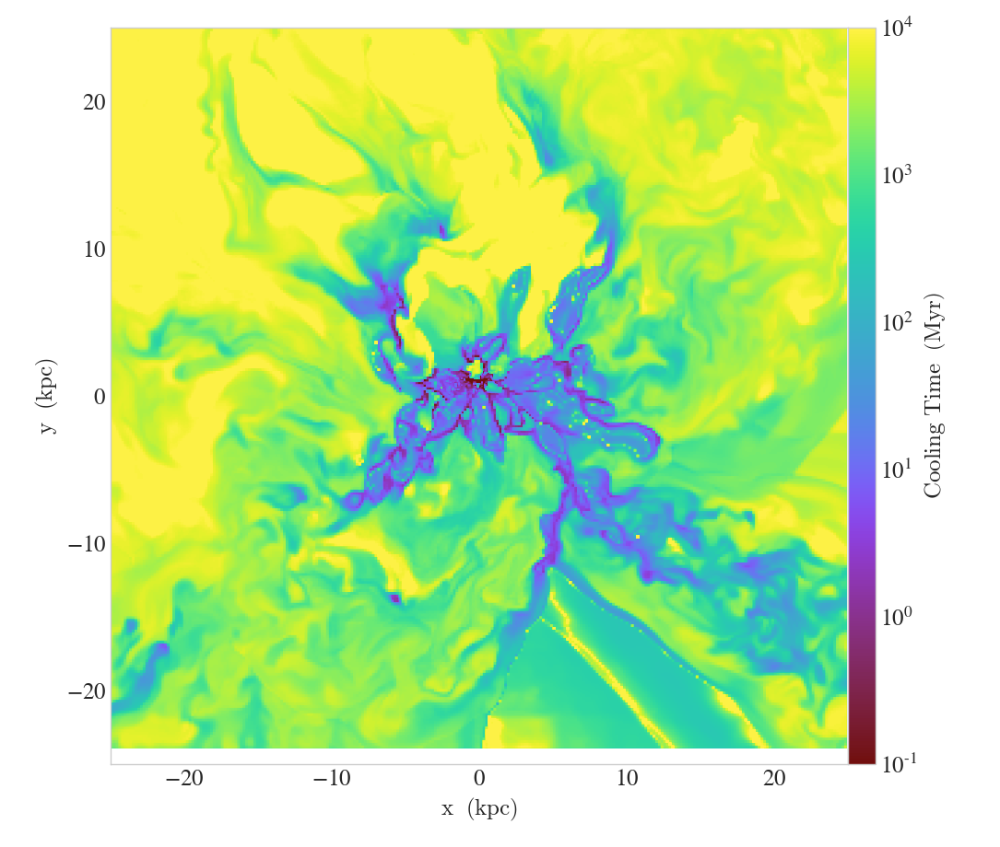

In [100]:
s = yt.SlicePlot(dsr, 'z', 'cooling_time', center=center, data_source=boxr, width=(width,'kpc'))
s.set_unit('cooling_time','Myr')
s.set_zlim('cooling_time',0.1,1.e4)
s.show()

yt : [INFO     ] 2018-02-28 14:40:31,493 xlim = 0.493512 0.494554
yt : [INFO     ] 2018-02-28 14:40:31,494 ylim = 0.488430 0.489473
yt : [INFO     ] 2018-02-28 14:40:31,496 xlim = 0.493512 0.494554
yt : [INFO     ] 2018-02-28 14:40:31,498 ylim = 0.488430 0.489473
yt : [INFO     ] 2018-02-28 14:40:31,500 Making a fixed resolution buffer of (('gas', 'cooling_time')) 800 by 800



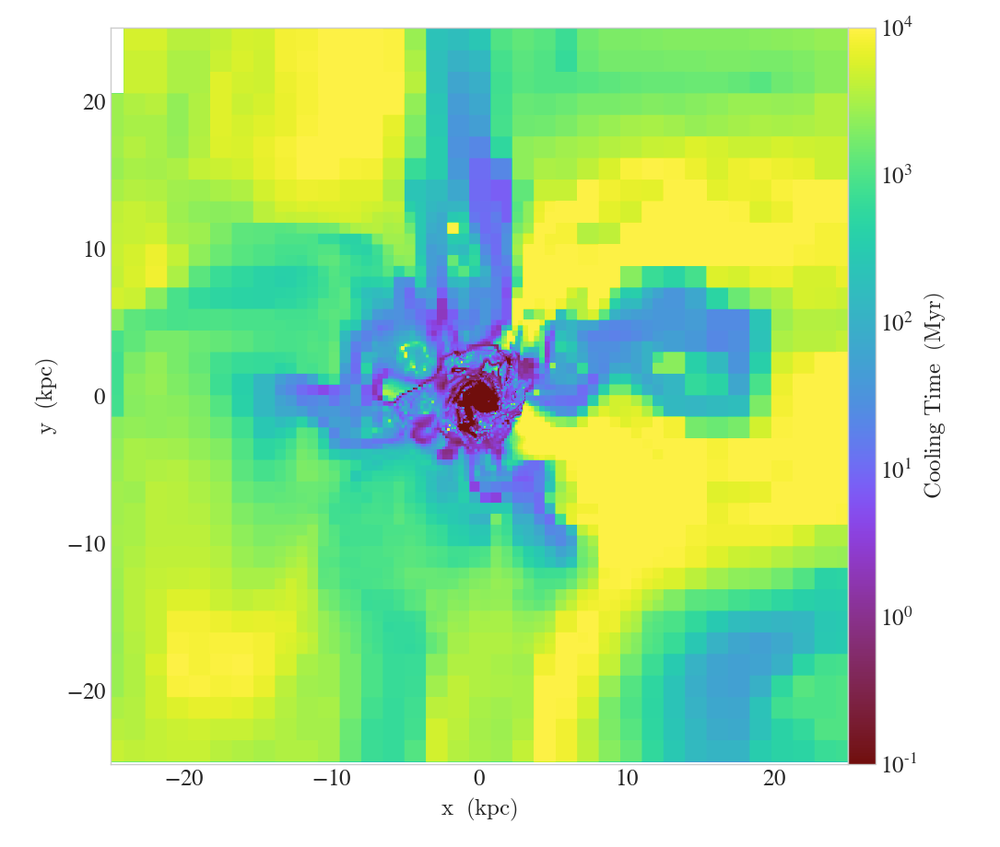

In [101]:
s = yt.SlicePlot(dsn, 'z', 'cooling_time', center=center, data_source=boxn, width=(width,'kpc'))
s.set_unit('cooling_time','Myr')
s.set_zlim('cooling_time',0.1,1.e4)
s.show()

yt : [INFO     ] 2018-02-28 14:45:40,132 Projection completed
yt : [INFO     ] 2018-02-28 14:45:40,134 xlim = 0.493512 0.494554
yt : [INFO     ] 2018-02-28 14:45:40,135 ylim = 0.488430 0.489473
yt : [INFO     ] 2018-02-28 14:45:40,137 xlim = 0.493512 0.494554
yt : [INFO     ] 2018-02-28 14:45:40,139 ylim = 0.488430 0.489473
yt : [INFO     ] 2018-02-28 14:45:40,141 Making a fixed resolution buffer of (('gas', 'cooling_time')) 800 by 800



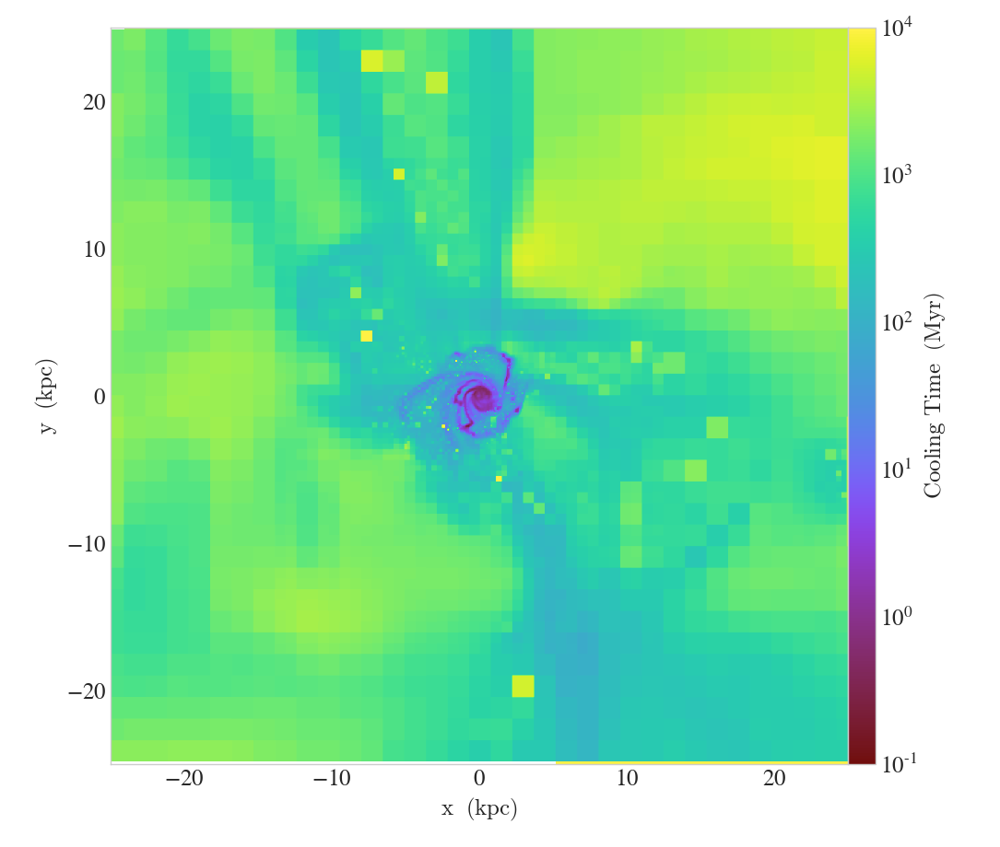

In [111]:
p = yt.ProjectionPlot(dsn, 'z', 'cooling_time', center=center, weight_field='density',data_source=boxn, width=(width,'kpc'))
p.set_unit('cooling_time','Myr')
p.set_zlim('cooling_time',0.1,1.e4)
p.show()

yt : [INFO     ] 2018-02-28 14:46:53,460 Projection completed
yt : [INFO     ] 2018-02-28 14:46:53,462 xlim = 0.501633 0.502676
yt : [INFO     ] 2018-02-28 14:46:53,463 ylim = 0.493512 0.494554
yt : [INFO     ] 2018-02-28 14:46:53,465 xlim = 0.501633 0.502676
yt : [INFO     ] 2018-02-28 14:46:53,467 ylim = 0.493512 0.494554
yt : [INFO     ] 2018-02-28 14:46:53,469 Making a fixed resolution buffer of (('gas', 'cooling_time')) 800 by 800



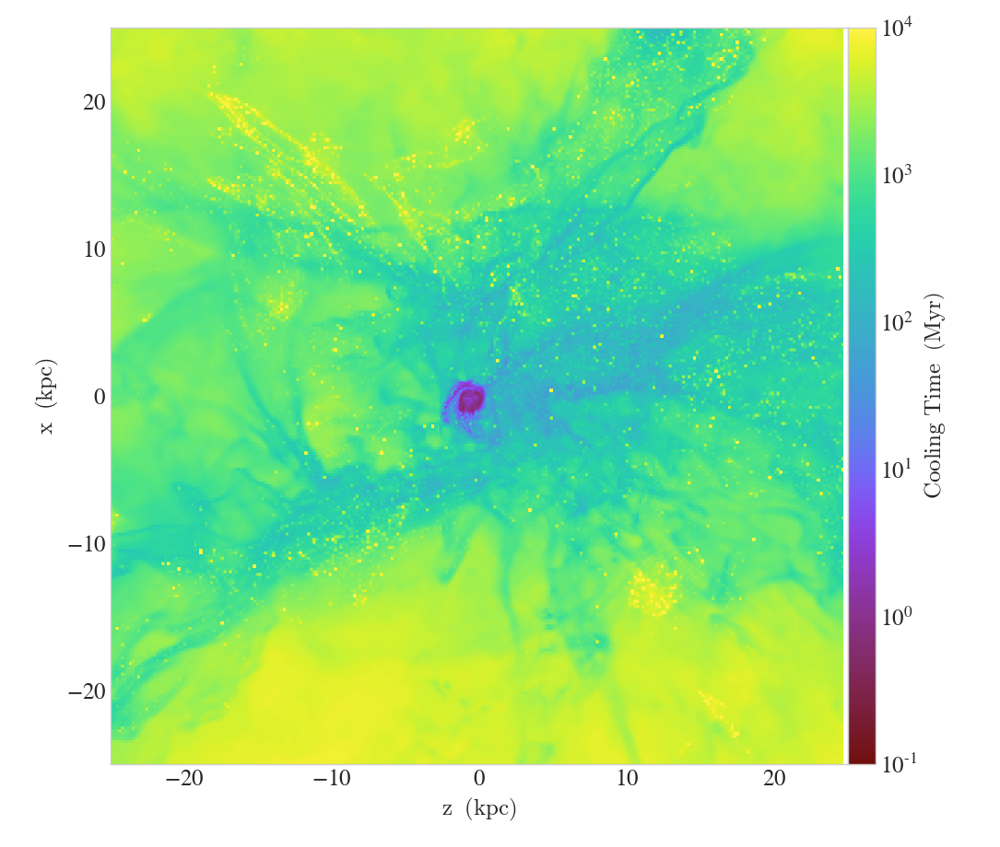

In [113]:
p = yt.ProjectionPlot(dsr, 'y', 'cooling_time', center=center, weight_field='density',data_source=boxr, width=(width,'kpc'))
p.set_unit('cooling_time','Myr')
p.set_zlim('cooling_time',0.1,1.e4)
p.show()

In [115]:
ds.field_list

[('all', 'creation_time'),
 ('all', 'dynamical_time'),
 ('all', 'metallicity_fraction'),
 ('all', 'particle_index'),
 ('all', 'particle_mass'),
 ('all', 'particle_position_x'),
 ('all', 'particle_position_y'),
 ('all', 'particle_position_z'),
 ('all', 'particle_type'),
 ('all', 'particle_velocity_x'),
 ('all', 'particle_velocity_y'),
 ('all', 'particle_velocity_z'),
 ('enzo', 'Cooling_Time'),
 ('enzo', 'Dark_Matter_Density'),
 ('enzo', 'Density'),
 ('enzo', 'Electron_Density'),
 ('enzo', 'GasEnergy'),
 ('enzo', 'HII_Density'),
 ('enzo', 'HI_Density'),
 ('enzo', 'HeIII_Density'),
 ('enzo', 'HeII_Density'),
 ('enzo', 'HeI_Density'),
 ('enzo', 'Metal_Density'),
 ('enzo', 'Temperature'),
 ('enzo', 'TotalEnergy'),
 ('enzo', 'x-velocity'),
 ('enzo', 'y-velocity'),
 ('enzo', 'z-velocity'),
 ('io', 'creation_time'),
 ('io', 'dynamical_time'),
 ('io', 'metallicity_fraction'),
 ('io', 'particle_index'),
 ('io', 'particle_mass'),
 ('io', 'particle_position_x'),
 ('io', 'particle_position_y'),
 ('

In [20]:

def get_halo_center(ds, center_guess, **kwargs):
    # returns a list of the halo center coordinates
    radius = kwargs.get("radius", 50.)  # search radius in kpc
    vel_radius = kwargs.get('vel_radius', 2.)

    # now determine the location of the highest DM density, which should be the center of the main halo
    ad = ds.sphere(center_guess, (radius, 'kpc')) # extract a sphere centered at the middle of the box
    x,y,z = np.array(ad["x"]), np.array(ad["y"]), np.array(ad["z"])
    dm_density =  ad['Dark_Matter_Density']
    imax = (np.where(dm_density > 0.9999 * np.max(dm_density)))[0]
    halo_center = [x[imax[0]], y[imax[0]], z[imax[0]]]
    print('We have located the main halo at :', halo_center)

    sph = ds.sphere(halo_center, (vel_radius,'kpc'))
    velocity = [np.mean(sph['x-velocity']), np.mean(sph['y-velocity']), np.mean(sph['z-velocity'])]

    return halo_center, velocity


In [21]:
hc, v = get_halo_center(dsr, centerr)

('We have located the main halo at :', [0.4940309524536133, 0.48897266387939453, 0.5021486282348633])


In [39]:
mh1n = np.sum(boxn['H_p0_number_density']*boxn['cell_volume'].in_cgs()) * 1.6737236e-24 * u.g
mh1r = np.sum(boxr['H_p0_number_density']*boxr['cell_volume'].in_cgs()) * 1.6737236e-24 * u.g
print('HI: ',np.log10(mh1n.to('Msun').value), np.log10(mh1r.to('Msun').value))

msi2n = np.sum(boxn['Si_p1_number_density']*boxn['cell_volume'].in_cgs()) * 4.6637066e-23 * u.g
msi2r = np.sum(boxr['Si_p1_number_density']*boxr['cell_volume'].in_cgs()) * 4.6637066e-23 * u.g
print('SiII: ',np.log10(msi2n.to('Msun').value), np.log10(msi2r.to('Msun').value))

mo6n = np.sum(boxn['O_p5_number_density']*boxn['cell_volume'].in_cgs()) * 2.6566962e-23 * u.g
mo6r = np.sum(boxr['O_p5_number_density']*boxr['cell_volume'].in_cgs()) * 2.6566962e-23 * u.g
print('OVI: ',np.log10(mo6n.to('Msun').value), np.log10(mo6r.to('Msun').value))

mn = np.sum(boxn['density']*boxn['cell_volume'].in_cgs())
mr = np.sum(boxr['density']*boxr['cell_volume'].in_cgs())
print('total: ',np.log10(mn.to('Msun').value), np.log10(mr.to('Msun').value))


('HI: ', 9.4839429297406603, 9.3743390499812591)
('SiII: ', 6.7358756783762743, 6.612135811350047)
('OVI: ', 4.4827072566853925, 4.4079422532493684)
('total: ', 9.899305669572076, 9.8490143485218962)



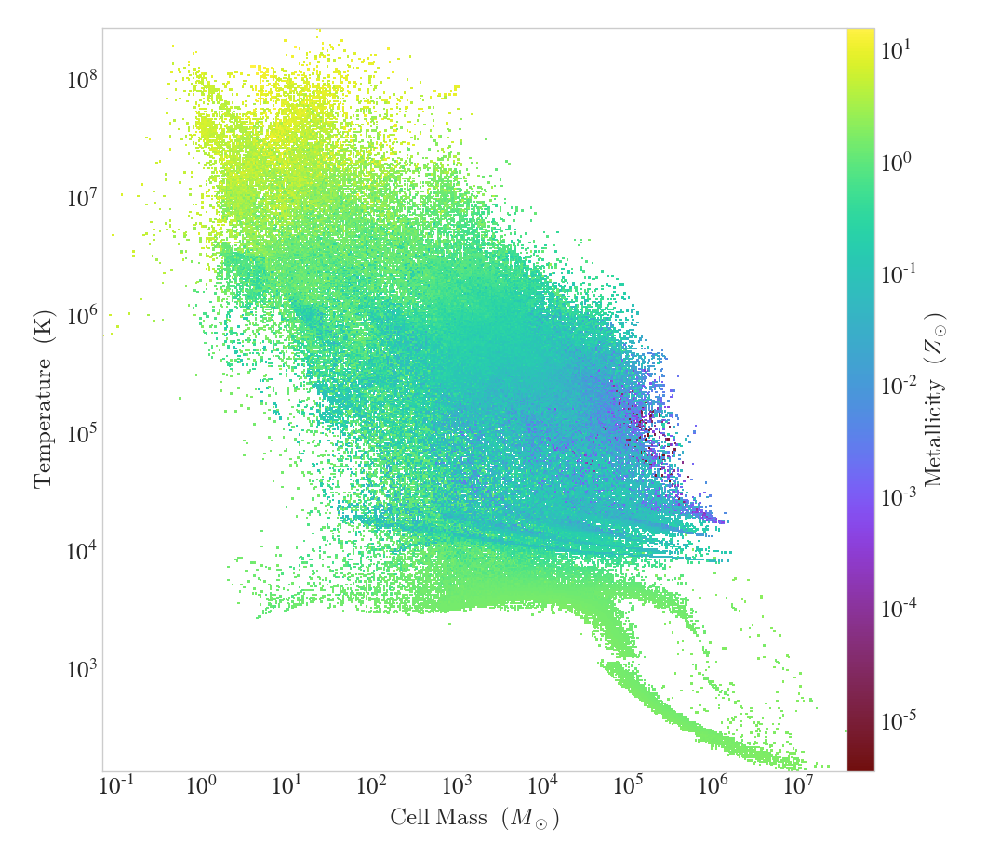

In [15]:
mt = yt.PhasePlot(boxn, 'cell_mass', 'temperature',['metallicity'],x_bins=512, y_bins=512)
mt.set_unit('cell_mass','Msun')
mt.show()


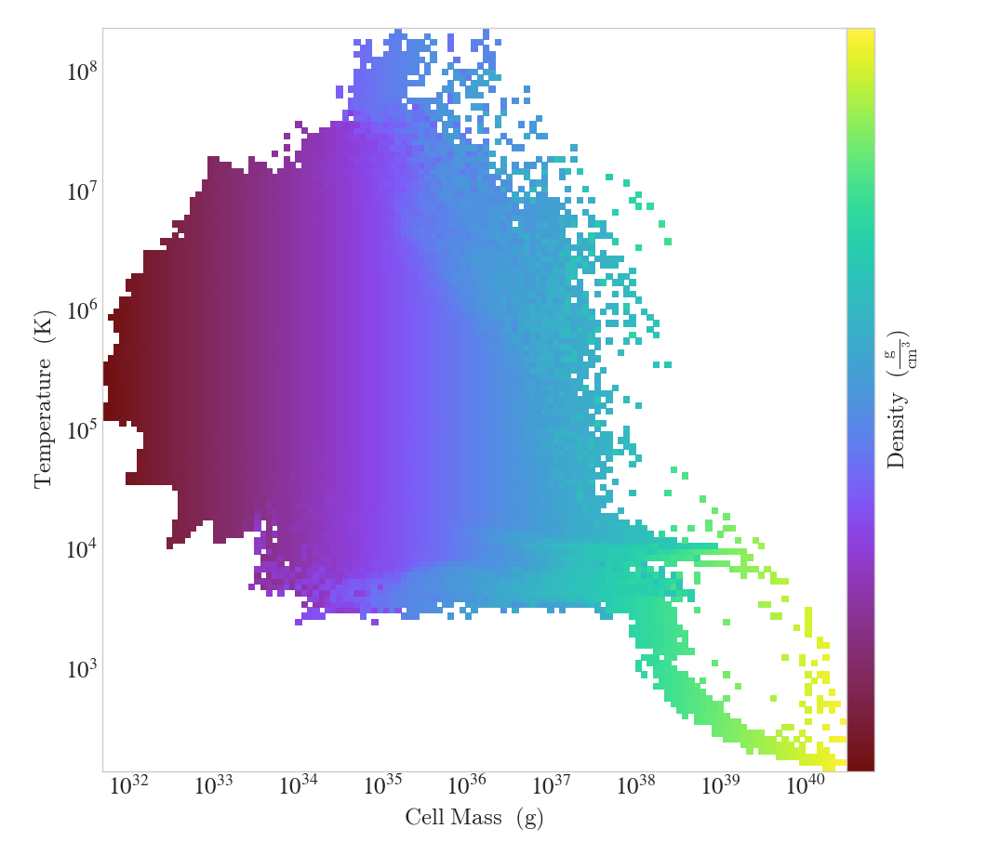

In [61]:
mtr = yt.PhasePlot(boxr, 'cell_mass', 'temperature', ['density'])
mtr.show()

In [16]:
def _si3_h1(field, data):
    return data['Si_p2_number_density'] / data['H_p0_number_density'] 

dsn.add_field(("gas", "si3_h1"), function=_si3_h1)
dsr.add_field(("gas", "si3_h1"), function=_si3_h1)


/Users/molly/anaconda2/envs/astroconda/lib/python2.7/site-packages/ipykernel_launcher.py:4: UserWarning: Because 'sampling_type' not specified, yt will assume a cell 'sampling_type'
  after removing the cwd from sys.path.
/Users/molly/anaconda2/envs/astroconda/lib/python2.7/site-packages/ipykernel_launcher.py:5: UserWarning: Because 'sampling_type' not specified, yt will assume a cell 'sampling_type'
  """


yt : [INFO     ] 2018-03-09 14:15:56,871 xlim = 0.493303 0.494763
yt : [INFO     ] 2018-03-09 14:15:56,872 ylim = 0.488222 0.489681
yt : [INFO     ] 2018-03-09 14:15:56,875 xlim = 0.493303 0.494763
yt : [INFO     ] 2018-03-09 14:15:56,876 ylim = 0.488222 0.489681
yt : [INFO     ] 2018-03-09 14:15:56,879 Making a fixed resolution buffer of (('gas', 'si3_h1')) 800 by 800
yt : [INFO     ] 2018-03-09 14:15:57,082 Making a fixed resolution buffer of (('gas', 'cooling_time')) 800 by 800



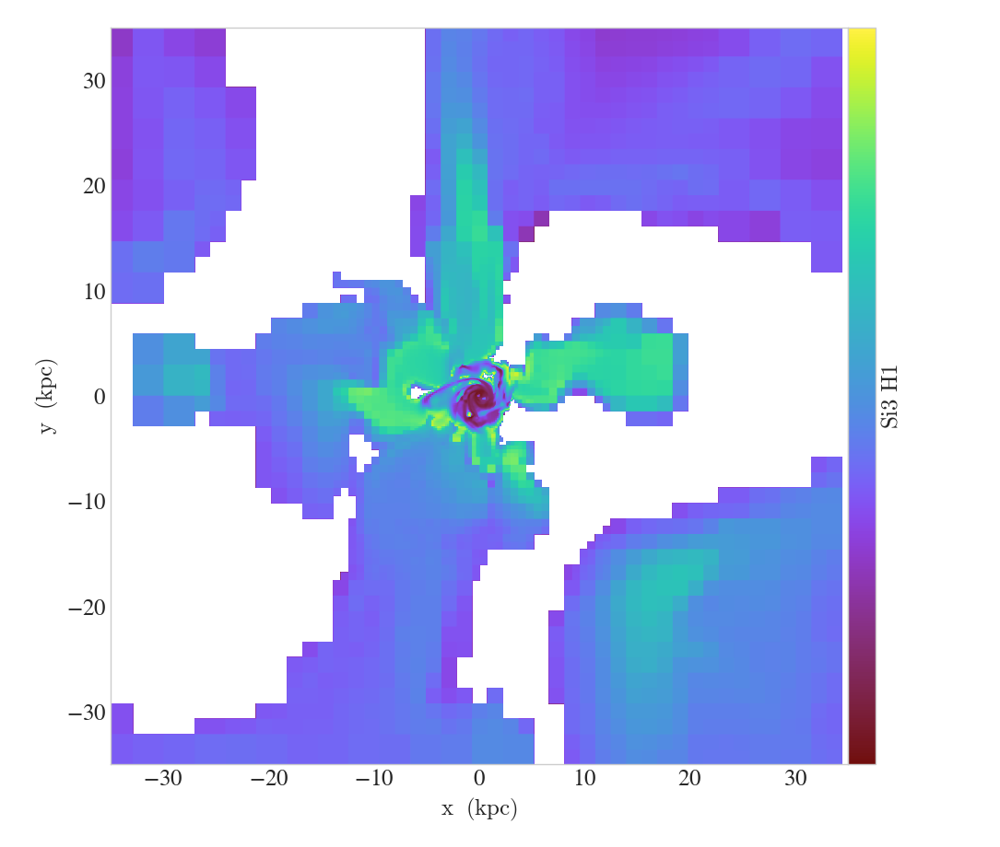

In [17]:
s = yt.SlicePlot(dsn, 'z', 'si3_h1', center=center, data_source=boxn, width=(width,'kpc'))
s.set_unit('cooling_time','Myr')
#s.set_zlim('cooling_time',0.1,1.e4)
s.show()

yt : [INFO     ] 2018-03-09 14:16:09,177 xlim = 0.493303 0.494763
yt : [INFO     ] 2018-03-09 14:16:09,178 ylim = 0.488222 0.489681
yt : [INFO     ] 2018-03-09 14:16:09,181 xlim = 0.493303 0.494763
yt : [INFO     ] 2018-03-09 14:16:09,182 ylim = 0.488222 0.489681
yt : [INFO     ] 2018-03-09 14:16:09,185 Making a fixed resolution buffer of (('gas', 'si3_h1')) 800 by 800
yt : [INFO     ] 2018-03-09 14:16:09,478 Making a fixed resolution buffer of (('gas', 'cooling_time')) 800 by 800



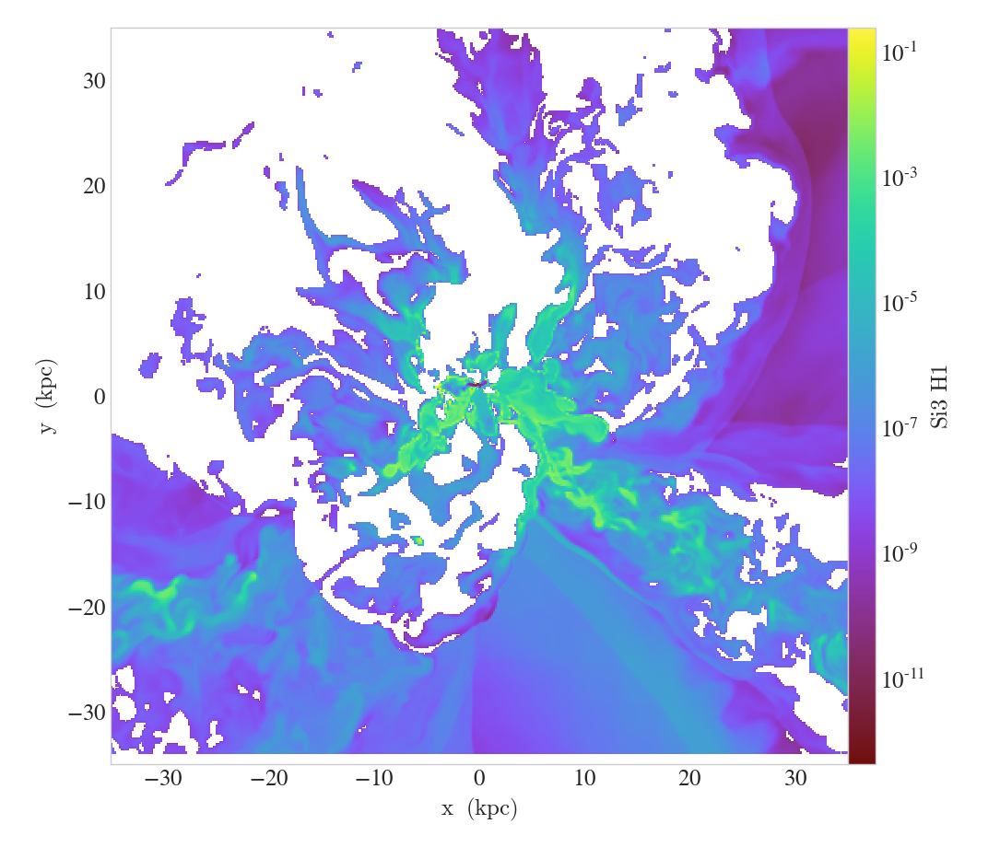

In [18]:
s = yt.SlicePlot(dsr, 'z', 'si3_h1', center=center, data_source=boxr, width=(width,'kpc'))
s.set_unit('cooling_time','Myr')
#s.set_zlim('cooling_time',0.1,1.e4)
s.show()

yt : [INFO     ] 2018-03-09 14:16:44,887 xlim = 0.493303 0.494763
yt : [INFO     ] 2018-03-09 14:16:44,888 ylim = 0.488222 0.489681
yt : [INFO     ] 2018-03-09 14:16:44,891 xlim = 0.493303 0.494763
yt : [INFO     ] 2018-03-09 14:16:44,892 ylim = 0.488222 0.489681
yt : [INFO     ] 2018-03-09 14:16:44,894 Making a fixed resolution buffer of (('gas', 'metallicity')) 800 by 800



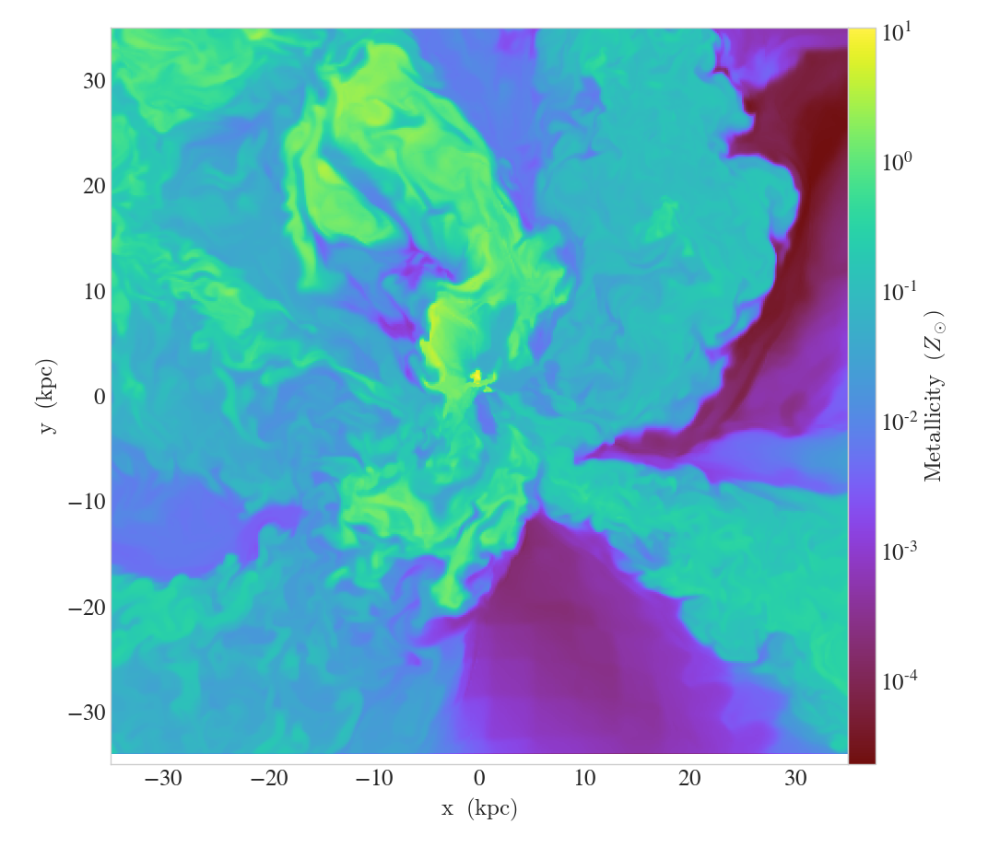

In [19]:
s = yt.SlicePlot(dsr, 'z', 'metallicity', center=center, data_source=boxr, width=(width,'kpc'))
#s.set_unit('cooling_time','Myr')
#s.set_zlim('cooling_time',0.1,1.e4)
s.show()

yt : [INFO     ] 2018-03-09 14:18:22,253 Projection completed
yt : [INFO     ] 2018-03-09 14:18:22,254 xlim = 0.493303 0.494763
yt : [INFO     ] 2018-03-09 14:18:22,256 ylim = 0.488222 0.489681
yt : [INFO     ] 2018-03-09 14:18:22,258 xlim = 0.493303 0.494763
yt : [INFO     ] 2018-03-09 14:18:22,259 ylim = 0.488222 0.489681
yt : [INFO     ] 2018-03-09 14:18:22,261 Making a fixed resolution buffer of (('gas', 'si3_h1')) 800 by 800
/Users/molly/anaconda2/envs/astroconda/lib/python2.7/site-packages/matplotlib/colors.py:1012: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0



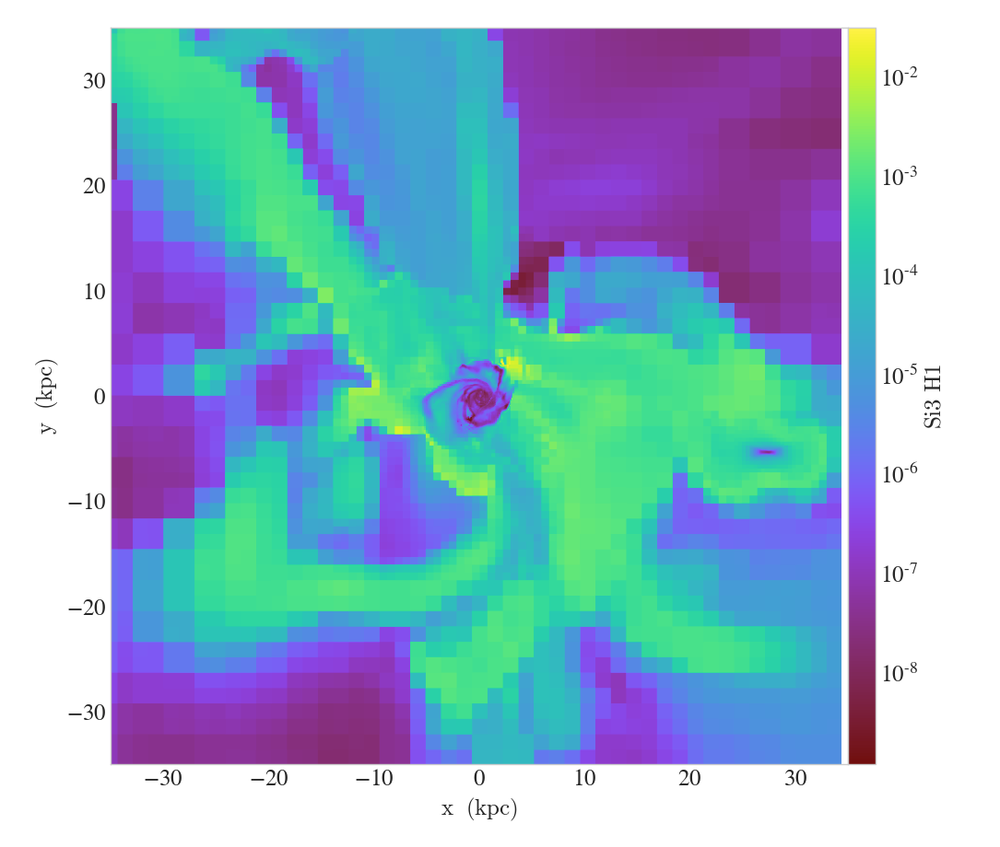

In [20]:
s = yt.ProjectionPlot(dsn, 'z', 'si3_h1', center=center, data_source=boxn, width=(width,'kpc'), weight_field='H_p0_number_density')
#s.set_unit('cooling_time','Myr')
#s.set_zlim('cooling_time',0.1,1.e4)
s.show()

yt : [INFO     ] 2018-03-09 14:19:30,446 Projection completed
yt : [INFO     ] 2018-03-09 14:19:30,448 xlim = 0.493303 0.494763
yt : [INFO     ] 2018-03-09 14:19:30,449 ylim = 0.488222 0.489681
yt : [INFO     ] 2018-03-09 14:19:30,452 xlim = 0.493303 0.494763
yt : [INFO     ] 2018-03-09 14:19:30,453 ylim = 0.488222 0.489681
yt : [INFO     ] 2018-03-09 14:19:30,455 Making a fixed resolution buffer of (('gas', 'si3_h1')) 800 by 800



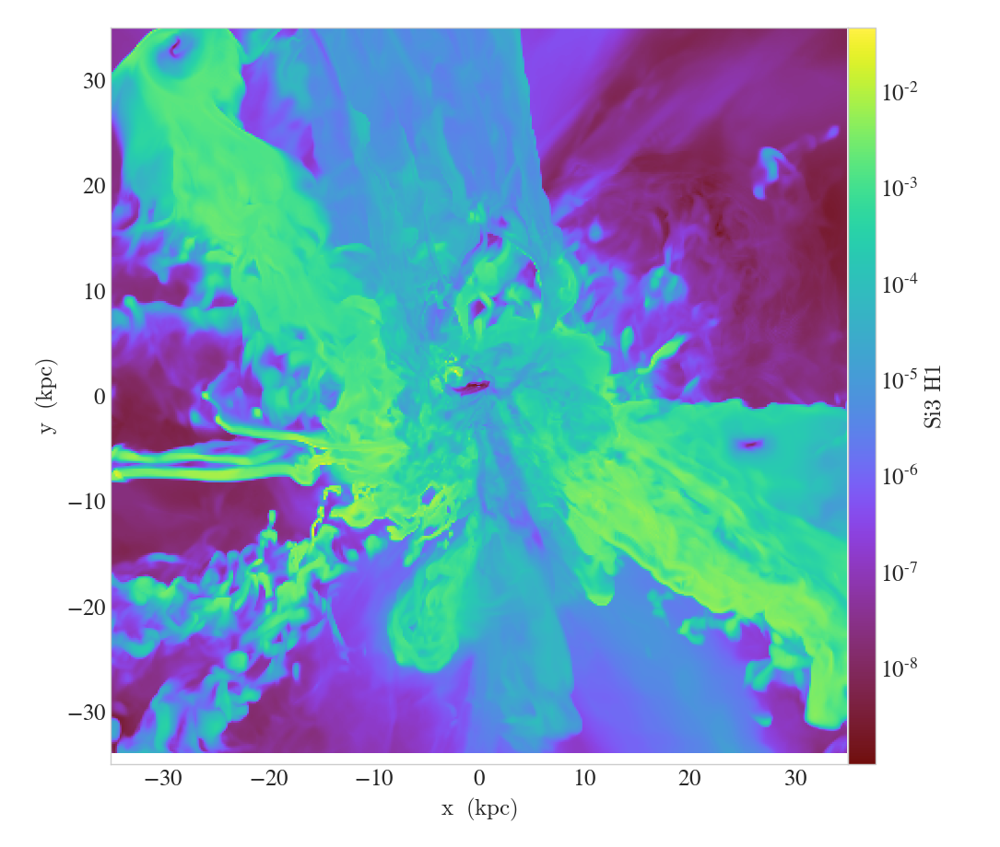

In [21]:
s = yt.ProjectionPlot(dsr, 'z', 'si3_h1', center=center, data_source=boxr, width=(width,'kpc'), weight_field='H_p0_number_density')
#s.set_unit('cooling_time','Myr')
#s.set_zlim('cooling_time',0.1,1.e4)
s.show()

yt : [INFO     ] 2018-03-09 14:21:47,000 Projection completed
yt : [INFO     ] 2018-03-09 14:21:47,001 xlim = 0.493303 0.494763
yt : [INFO     ] 2018-03-09 14:21:47,003 ylim = 0.488222 0.489681
yt : [INFO     ] 2018-03-09 14:21:47,005 xlim = 0.493303 0.494763
yt : [INFO     ] 2018-03-09 14:21:47,006 ylim = 0.488222 0.489681
yt : [INFO     ] 2018-03-09 14:21:47,008 Making a fixed resolution buffer of (('gas', 'metallicity')) 800 by 800



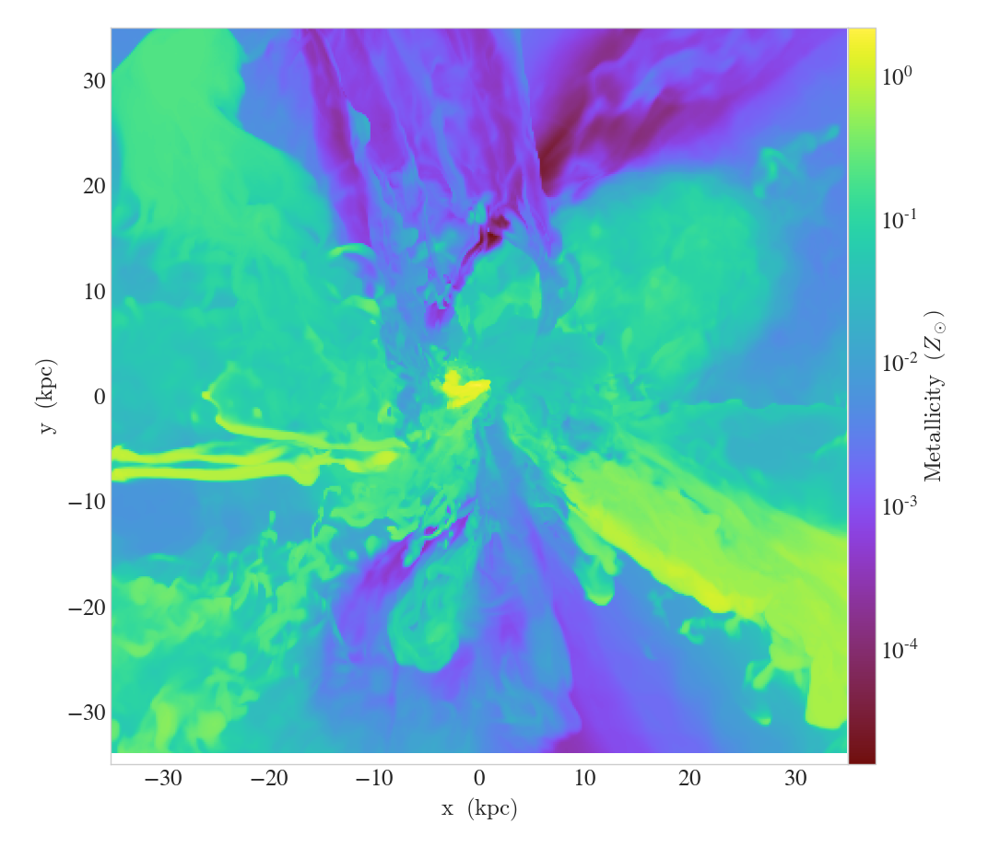

In [23]:
s = yt.ProjectionPlot(dsr, 'z', 'metallicity', center=center, data_source=boxr, width=(width,'kpc'), weight_field='H_p0_number_density')
#s.set_unit('cooling_time','Myr')
#s.set_zlim('cooling_time',0.1,1.e4)
s.show()

yt : [INFO     ] 2018-03-09 14:21:48,349 Projection completed
yt : [INFO     ] 2018-03-09 14:21:48,350 xlim = 0.493303 0.494763
yt : [INFO     ] 2018-03-09 14:21:48,352 ylim = 0.488222 0.489681
yt : [INFO     ] 2018-03-09 14:21:48,354 xlim = 0.493303 0.494763
yt : [INFO     ] 2018-03-09 14:21:48,355 ylim = 0.488222 0.489681
yt : [INFO     ] 2018-03-09 14:21:48,358 Making a fixed resolution buffer of (('gas', 'metallicity')) 800 by 800



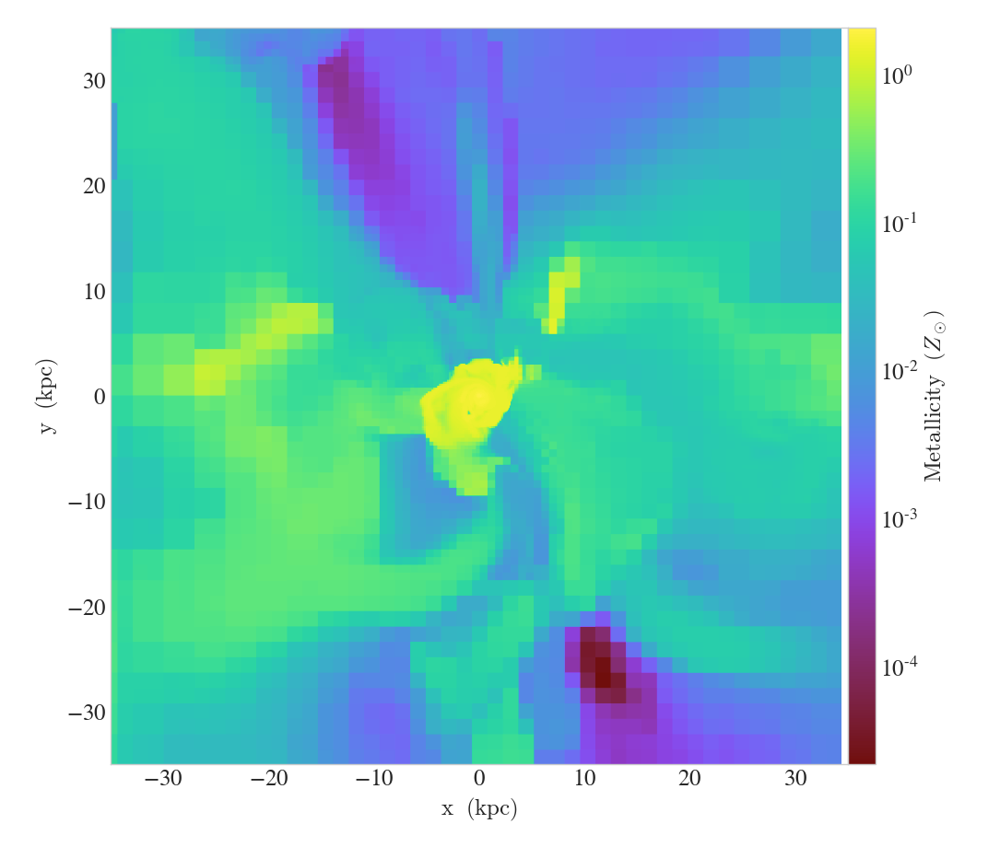

In [24]:
s = yt.ProjectionPlot(dsn, 'z', 'metallicity', center=center, data_source=boxn, width=(width,'kpc'), weight_field='H_p0_number_density')
#s.set_unit('cooling_time','Myr')
#s.set_zlim('cooling_time',0.1,1.e4)
s.show()

In [40]:
from yt.analysis_modules.star_analysis.api import StarFormationRate
from yt.data_objects.particle_filters import add_particle_filter

def Stars(pfilter, data):
      return data[("all", "particle_type")] == 2
add_particle_filter("stars", function=Stars, filtered_type='all',
                    requires=["particle_type"])

dsn.add_particle_filter('stars')
dsr.add_particle_filter('stars')

mstarn = boxn[("stars", "particle_mass")].in_units('Msun')
mstarr = boxr[("stars", "particle_mass")].in_units('Msun')

print np.log10(np.sum(mstarn).value), np.log10(np.sum(mstarr).value)


/Users/molly/anaconda2/envs/astroconda/lib/python2.7/site-packages/ipykernel_launcher.py:1: VisibleDeprecationWarning: The star_analysis module has been deprecated. This code has been moved to the yt attic (https://github.com/yt-project/yt_attic) and will be removed in a future release.
  """Entry point for launching an IPython kernel.


True

In [49]:
print np.sum(mstarr) - np.sum(mstarn)
print mn.to('Msun') - mr.to('Msun')

10.0418212457 10.0943528531
1415755154.8 Msun
867184227.329 Msun


In [52]:
(np.sum(mstarr).value-np.sum(mstarn).value)/np.sum(mstarn).value

0.12857807097393922

In [54]:
boxr

YTRegion (RD0020): , center=[  7.31136879e+25   7.23650908e+25   7.43150564e+25] cm, left_edge=[  7.30056893e+25   7.22570922e+25   7.42070577e+25] cm, right_edge=[  7.32216865e+25   7.24730895e+25   7.44230550e+25] cm

In [ ]:
###### let's learn about angular momentum!!
dsn.fields

yt : [INFO     ] 2018-04-30 09:45:04,986 xlim = 0.501268 0.503040
yt : [INFO     ] 2018-04-30 09:45:04,987 ylim = 0.493147 0.494919
yt : [INFO     ] 2018-04-30 09:45:04,989 xlim = 0.501268 0.503040
yt : [INFO     ] 2018-04-30 09:45:04,990 ylim = 0.493147 0.494919
yt : [INFO     ] 2018-04-30 09:45:04,991 Making a fixed resolution buffer of (('gas', 'pressure')) 800 by 800



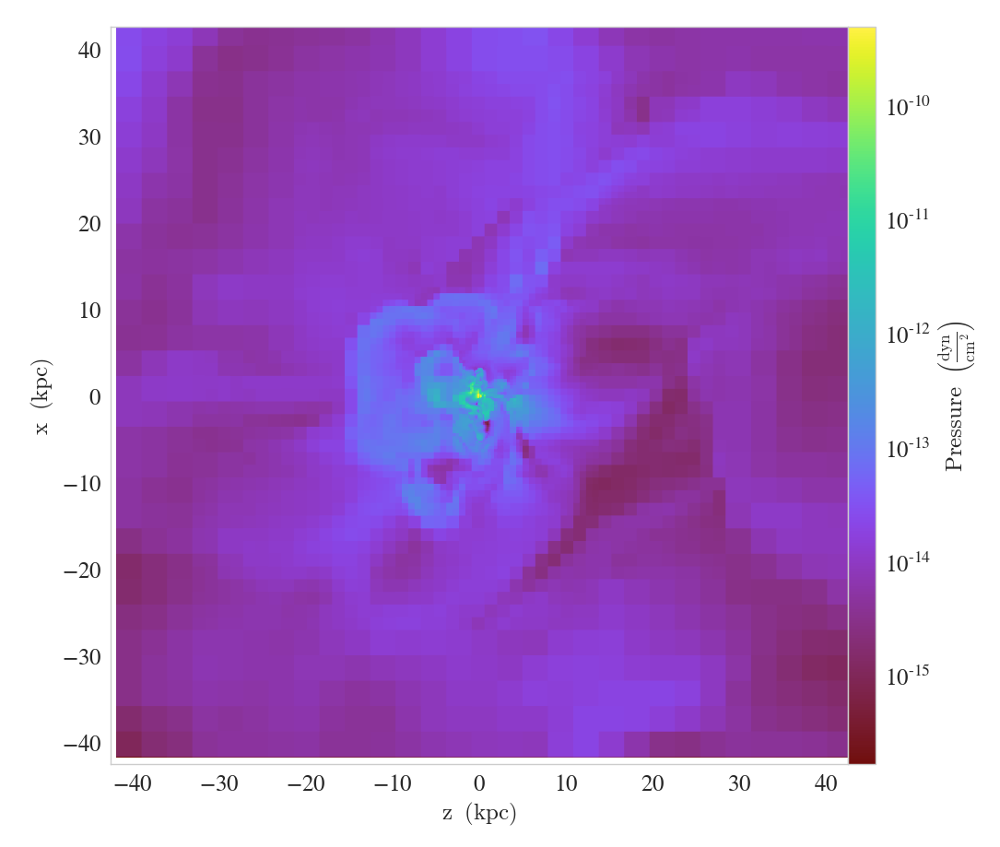

In [5]:
s = yt.SlicePlot(ds, "y", 'pressure', center=center, data_source=box, width=(width,'kpc'))
# s.set_zlim("O_p5_ion_fraction", 1.e-5,0.2)
s.show()

In [13]:
trident.add_ion_fields(dsr, ions=['Si IV'])
trident.add_ion_fields(dsn, ions=['Si IV'])


In [18]:
@derived_field(name="civ_siiv", force_override=True)
def _civ_siiv(field, data):
    return data['C_p3_number_density'] / data['Si_p3_number_density']

dsn.add_field(('civ_siiv'), function=_civ_siiv, force_override=True)
dsr.add_field(('civ_siiv'), function=_civ_siiv, force_override=True)

/Users/molly/anaconda2/envs/astroconda/lib/python2.7/site-packages/ipykernel/__main__.py:5: UserWarning: Because 'sampling_type' not specified, yt will assume a cell 'sampling_type'
/Users/molly/anaconda2/envs/astroconda/lib/python2.7/site-packages/ipykernel/__main__.py:6: UserWarning: Because 'sampling_type' not specified, yt will assume a cell 'sampling_type'


yt : [INFO     ] 2018-05-24 10:07:48,521 Projection completed
yt : [INFO     ] 2018-05-24 10:07:48,522 xlim = 0.501149 0.503149
yt : [INFO     ] 2018-05-24 10:07:48,523 ylim = 0.493031 0.495031
yt : [INFO     ] 2018-05-24 10:07:48,525 xlim = 0.501149 0.503149
yt : [INFO     ] 2018-05-24 10:07:48,525 ylim = 0.493031 0.495031
yt : [INFO     ] 2018-05-24 10:07:48,527 Making a fixed resolution buffer of (('gas', 'civ_siiv')) 800 by 800



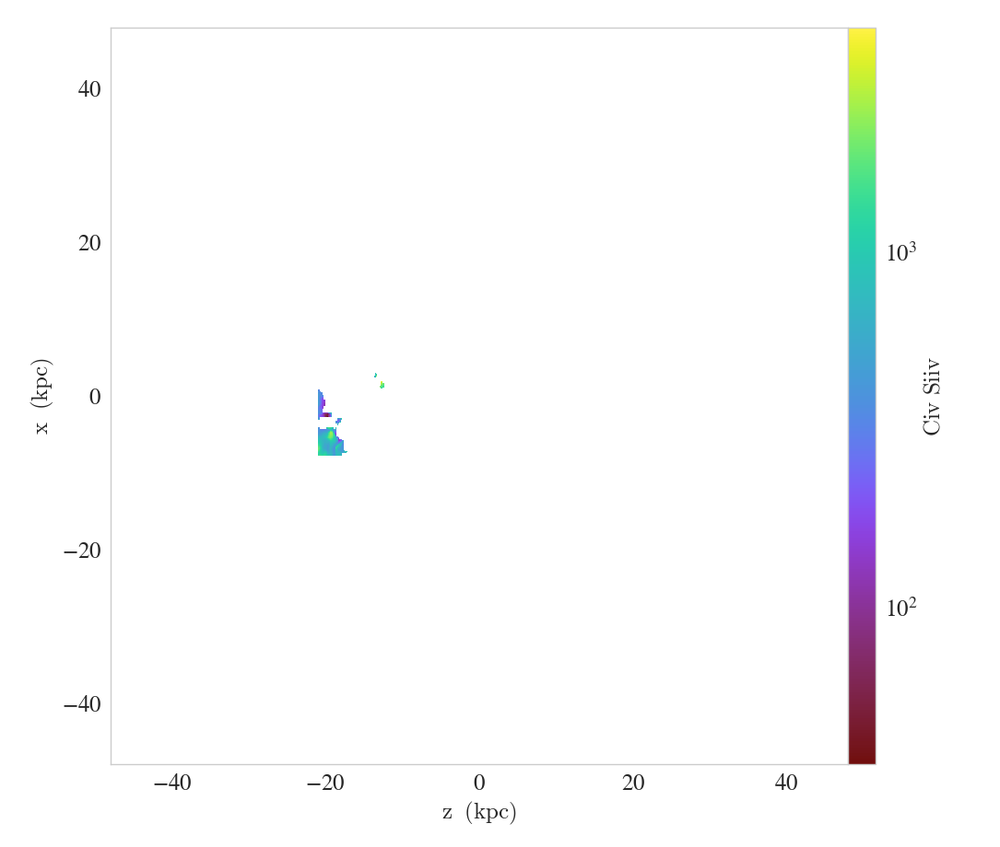

In [22]:
p = yt.ProjectionPlot(dsr, "y", 'civ_siiv', center=centerr, weight_field='C_p3_number_density', data_source=boxr, width=(refine_width,'kpc'))
p.show()

In [4]:
ad = ds.all_data()

In [5]:
ad = ds.all_data()
x,y,z = np.array(ad["x"]), np.array(ad["y"]), np.array(ad["z"])
dm_density =  ad['Dark_Matter_Density']
imax = (np.where(dm_density > 0.9999 * np.max(dm_density)))[0]
halo_center = [x[imax[0]], y[imax[0]], z[imax[0]]]


Parsing Hierarchy : 100%|██████████| 523/523 [00:00<00:00, 23080.30it/s]
yt : [INFO     ] 2018-06-08 10:58:58,344 Gathering a field list (this may take a moment.)


In [7]:
left = [0.497972, 0.494268, 0.497926]
right = [0.499972, 0.496268, 0.499926] 
refine_box_center = 0.5 *(np.array(left) + np.array(right))
print halo_center, refine_box_center


[0.49558353424072266, 0.49534130096435547, 0.49911022186279297] [ 0.498972  0.495268  0.498926]


yt : [INFO     ] 2018-06-08 11:04:25,785 Projection completed
yt : [INFO     ] 2018-06-08 11:04:25,786 xlim = 0.491414 0.499754
yt : [INFO     ] 2018-06-08 11:04:25,787 ylim = 0.491171 0.499511
yt : [INFO     ] 2018-06-08 11:04:25,790 xlim = 0.491414 0.499754
yt : [INFO     ] 2018-06-08 11:04:25,790 ylim = 0.491171 0.499511
yt : [INFO     ] 2018-06-08 11:04:25,792 Making a fixed resolution buffer of (('gas', 'density')) 800 by 800



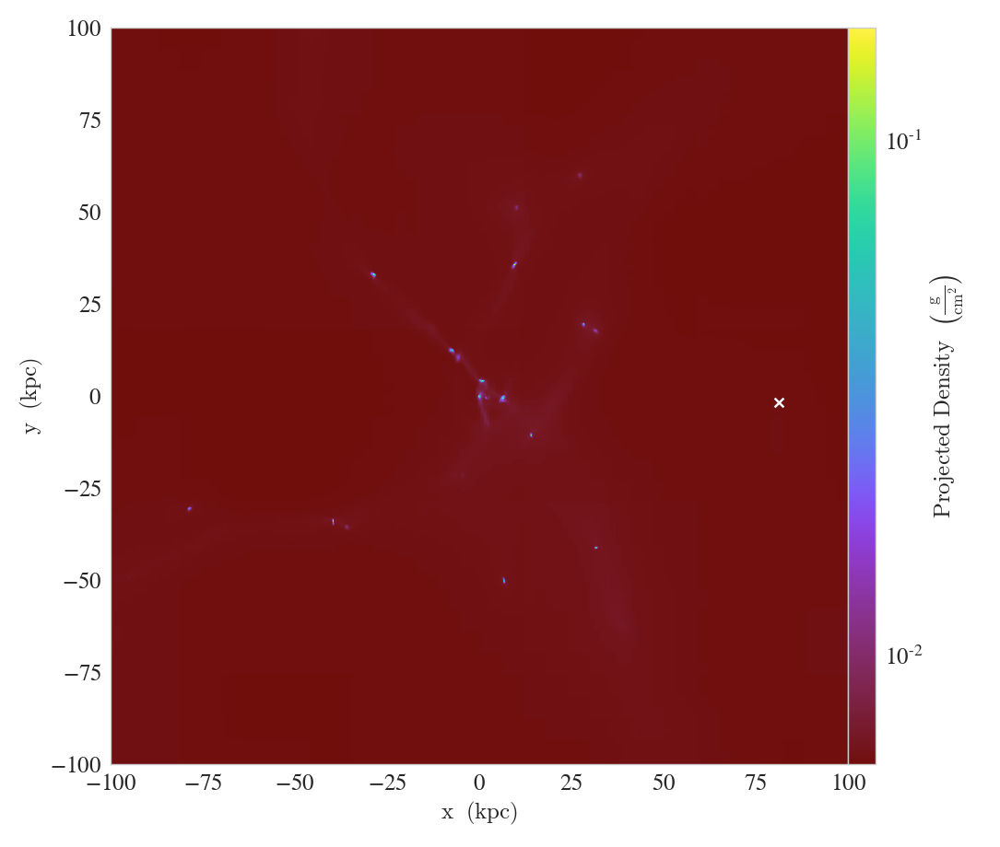

In [11]:
s = yt.ProjectionPlot(ds, 'z', 'density', center=halo_center, data_source=ad, width=(200.,'kpc'))
#s.set_unit('cooling_time','Myr')
#s.set_zlim('cooling_time',0.1,1.e4)
s.annotate_marker(refine_box_center, coord_system='data')
s.show()

yt : [INFO     ] 2018-06-08 11:07:02,142 xlim = 0.491414 0.499754
yt : [INFO     ] 2018-06-08 11:07:02,143 ylim = 0.491171 0.499511
yt : [INFO     ] 2018-06-08 11:07:02,145 xlim = 0.491414 0.499754
yt : [INFO     ] 2018-06-08 11:07:02,146 ylim = 0.491171 0.499511
yt : [INFO     ] 2018-06-08 11:07:02,148 Making a fixed resolution buffer of (('index', 'grid_level')) 800 by 800



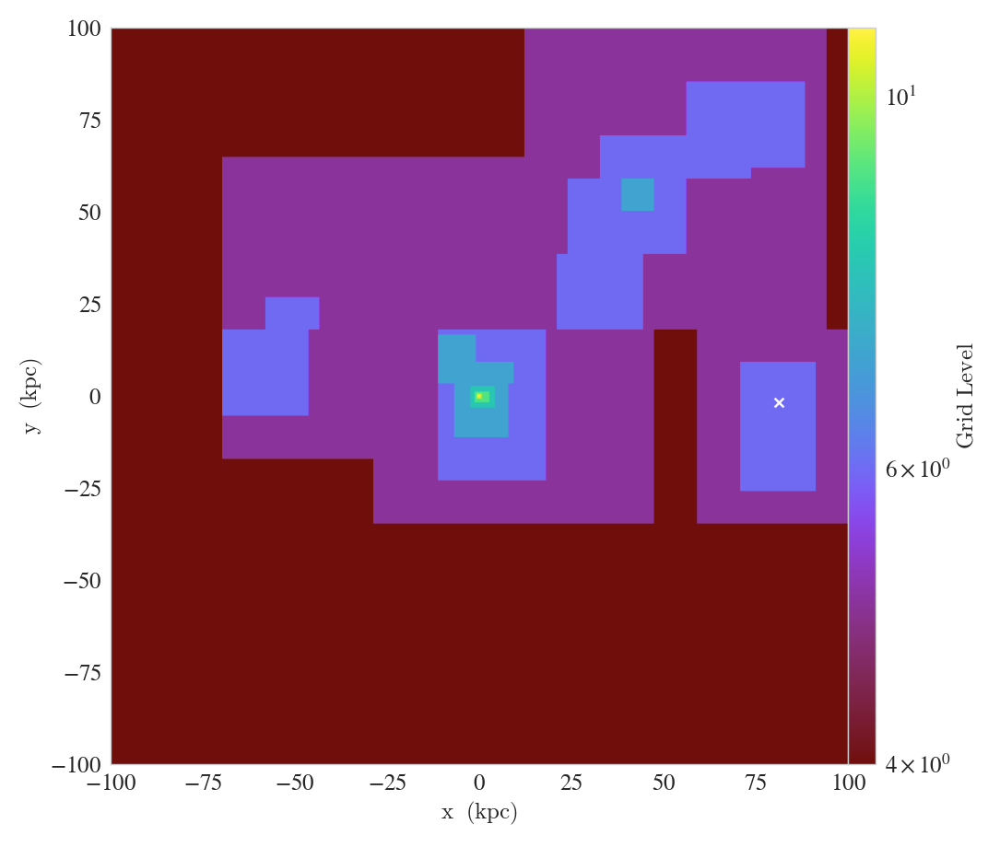

In [14]:
s = yt.SlicePlot(ds, 'z', ('index', 'grid_level'), center=halo_center, data_source=ad, width=(200.,'kpc'))
#s.set_unit('cooling_time','Myr')
#s.set_zlim('cooling_time',0.1,1.e4)
s.annotate_marker(refine_box_center, coord_system='data')
s.show()

In [15]:
ds = yt.load("/astro/simulations/FOGGIE/halo_008508/nref11n_selfshield_z15/natural/RD0014/RD0014")
ad = ds.all_data()
x,y,z = np.array(ad["x"]), np.array(ad["y"]), np.array(ad["z"])
dm_density =  ad['Dark_Matter_Density']
imax = (np.where(dm_density > 0.9999 * np.max(dm_density)))[0]
halo_center = [x[imax[0]], y[imax[0]], z[imax[0]]]


yt : [INFO     ] 2018-06-08 11:09:53,696 Parameters: current_time              = 72.7890686357
yt : [INFO     ] 2018-06-08 11:09:53,697 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2018-06-08 11:09:53,699 Parameters: domain_left_edge          = [ 0.  0.  0.]
yt : [INFO     ] 2018-06-08 11:09:53,700 Parameters: domain_right_edge         = [ 1.  1.  1.]
yt : [INFO     ] 2018-06-08 11:09:53,702 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2018-06-08 11:09:53,702 Parameters: current_redshift          = 3.99999897423
yt : [INFO     ] 2018-06-08 11:09:53,703 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2018-06-08 11:09:53,704 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2018-06-08 11:09:53,706 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 590/590 [00:00<00:00, 8462.30it/s]
yt : [INFO     ] 2018-06-08 11:09:53,836 Gathering a field list (this may take a moment.)


[0.49540996551513672, 0.49414920806884766, 0.49956417083740234] [ 0.495398  0.494158  0.499567]


yt : [INFO     ] 2018-06-08 11:11:39,427 xlim = 0.491935 0.498885
yt : [INFO     ] 2018-06-08 11:11:39,428 ylim = 0.490674 0.497624
yt : [INFO     ] 2018-06-08 11:11:39,430 xlim = 0.491935 0.498885
yt : [INFO     ] 2018-06-08 11:11:39,431 ylim = 0.490674 0.497624
yt : [INFO     ] 2018-06-08 11:11:39,433 Making a fixed resolution buffer of (('index', 'grid_level')) 800 by 800



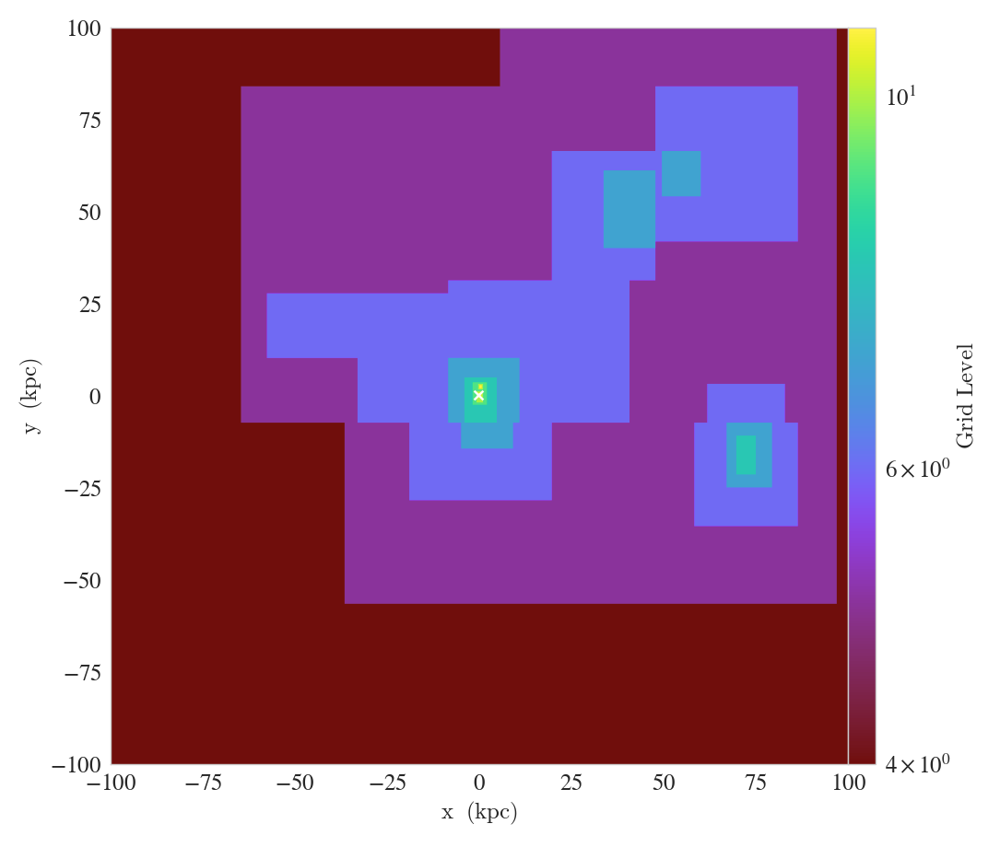

In [16]:
left = [0.494398, 0.493158, 0.498567]
right = [0.496398, 0.495158, 0.500567 ] 
refine_box_center = 0.5 *(np.array(left) + np.array(right))
print halo_center, refine_box_center

s = yt.SlicePlot(ds, 'z', ('index', 'grid_level'), center=halo_center, data_source=ad, width=(200.,'kpc'))
#s.set_unit('cooling_time','Myr')
#s.set_zlim('cooling_time',0.1,1.e4)
s.annotate_marker(refine_box_center, coord_system='data')
s.show()

yt : [INFO     ] 2018-06-23 14:13:30,492 Projection completed
yt : [INFO     ] 2018-06-23 14:13:30,493 xlim = 0.501263 0.503035
yt : [INFO     ] 2018-06-23 14:13:30,495 ylim = 0.493145 0.494917
yt : [INFO     ] 2018-06-23 14:13:30,497 xlim = 0.501263 0.503035
yt : [INFO     ] 2018-06-23 14:13:30,499 ylim = 0.493145 0.494917
yt : [INFO     ] 2018-06-23 14:13:30,501 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800



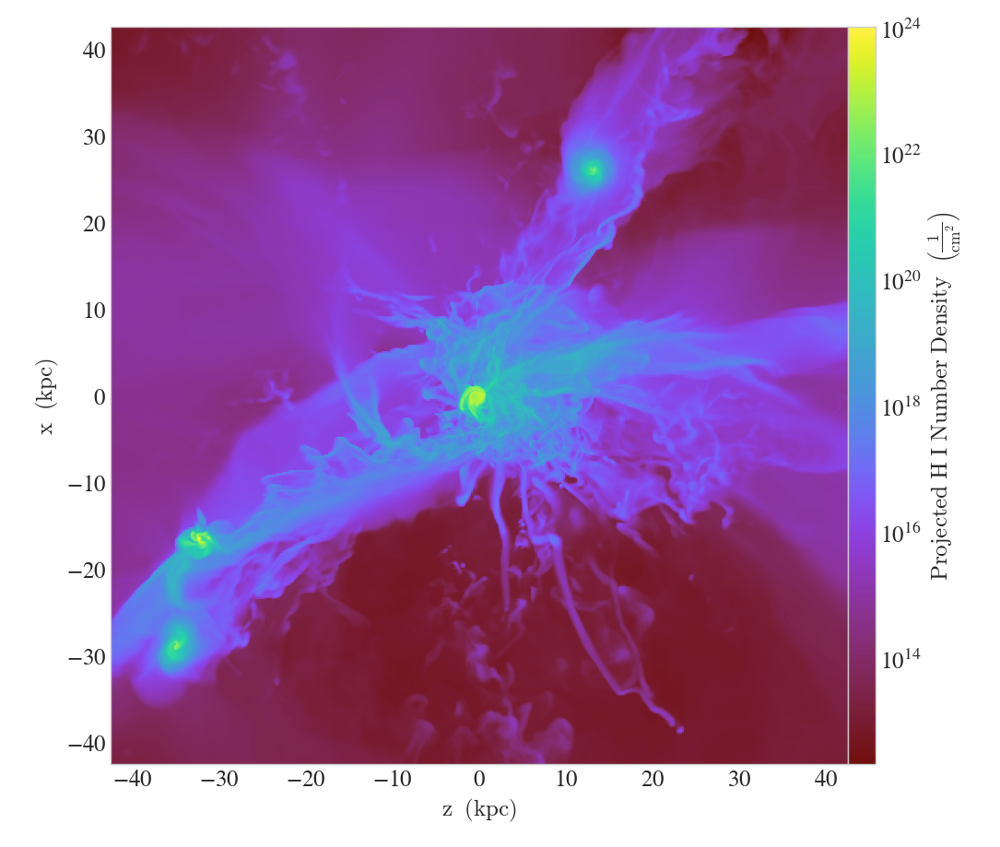

In [91]:
pr = yt.ProjectionPlot(dsr, 'y', ('gas','H_p0_number_density'), center=centerr, data_source=refine_box, width=(width,'kpc'))
# p = yt.ProjectionPlot(dsr, 'y', 'metallicity', center=centerr, data_source=refine_box, width=(width,'kpc'), weight_field=('gas','density'))
pr.show()
frbr = pr.frb

yt : [INFO     ] 2018-06-23 14:24:51,312 Projection completed
yt : [INFO     ] 2018-06-23 14:24:51,314 xlim = 0.501268 0.503040
yt : [INFO     ] 2018-06-23 14:24:51,315 ylim = 0.493147 0.494919
yt : [INFO     ] 2018-06-23 14:24:51,317 xlim = 0.501268 0.503040
yt : [INFO     ] 2018-06-23 14:24:51,319 ylim = 0.493147 0.494919
yt : [INFO     ] 2018-06-23 14:24:51,321 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800



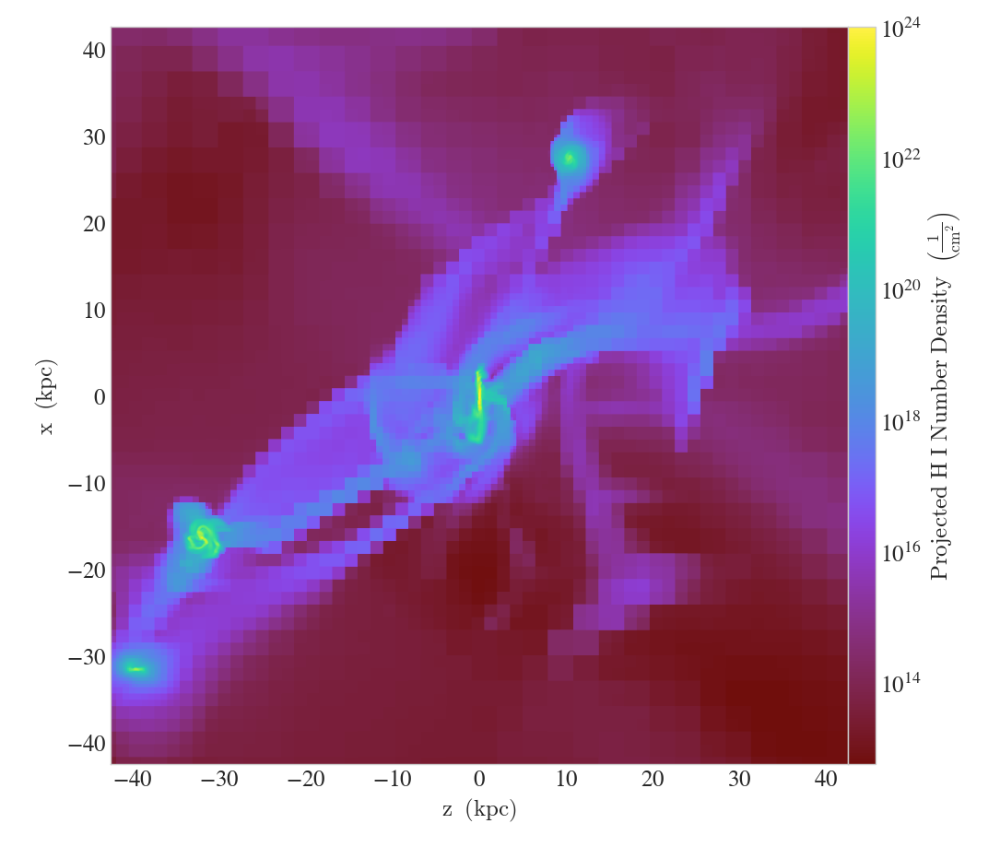

TypeError: 'FixedResolutionBuffer' object is not callable

In [114]:
pn = yt.ProjectionPlot(dsn, 'y', ('gas','H_p0_number_density'), center=center, data_source=refine_box_natural, width=(width,'kpc'))
pn.show()
res = [524, 524] 
#frb = pn.frb(width, res, center=center)
frbn = pn.frb(width, res, center=center)

In [96]:
# frb = p.frb
# frb = p.data_source.to_frb(width, (1048,1048), center=centerr)
print frbr['H_p0_number_density']
test = np.array(frbr['H_p0_number_density'])
print(test.max(), test.min())
hicol = np.sort(test.ravel())

[[2.10827760e+13 2.10655970e+13 2.10211578e+13 ... 1.31859426e+13
  1.32916542e+13 1.35610479e+13]
 [2.13256839e+13 2.13053435e+13 2.12477123e+13 ... 1.32158938e+13
  1.33266082e+13 1.35989239e+13]
 [2.20864557e+13 2.20535732e+13 2.19414344e+13 ... 1.33144866e+13
  1.34403048e+13 1.37174014e+13]
 ...
 [6.05313249e+12 6.09355648e+12 6.21782703e+12 ... 4.00754399e+13
  4.05882719e+13 4.21800401e+13]
 [6.06585995e+12 6.10429840e+12 6.22000145e+12 ... 3.98584517e+13
  4.04565920e+13 4.22408186e+13]
 [6.11311147e+12 6.15095337e+12 6.25815422e+12 ... 3.80983449e+13
  3.88866723e+13 4.11885427e+13]] cm**(-2)
(1.0525141781976221e+24, 2116416876050.6628)


2116416876050.6628 5676939101337.08
1.0525141781976221e+24 1.0434179835150716e+24
640000 640000


<IPython.core.display.Javascript object>


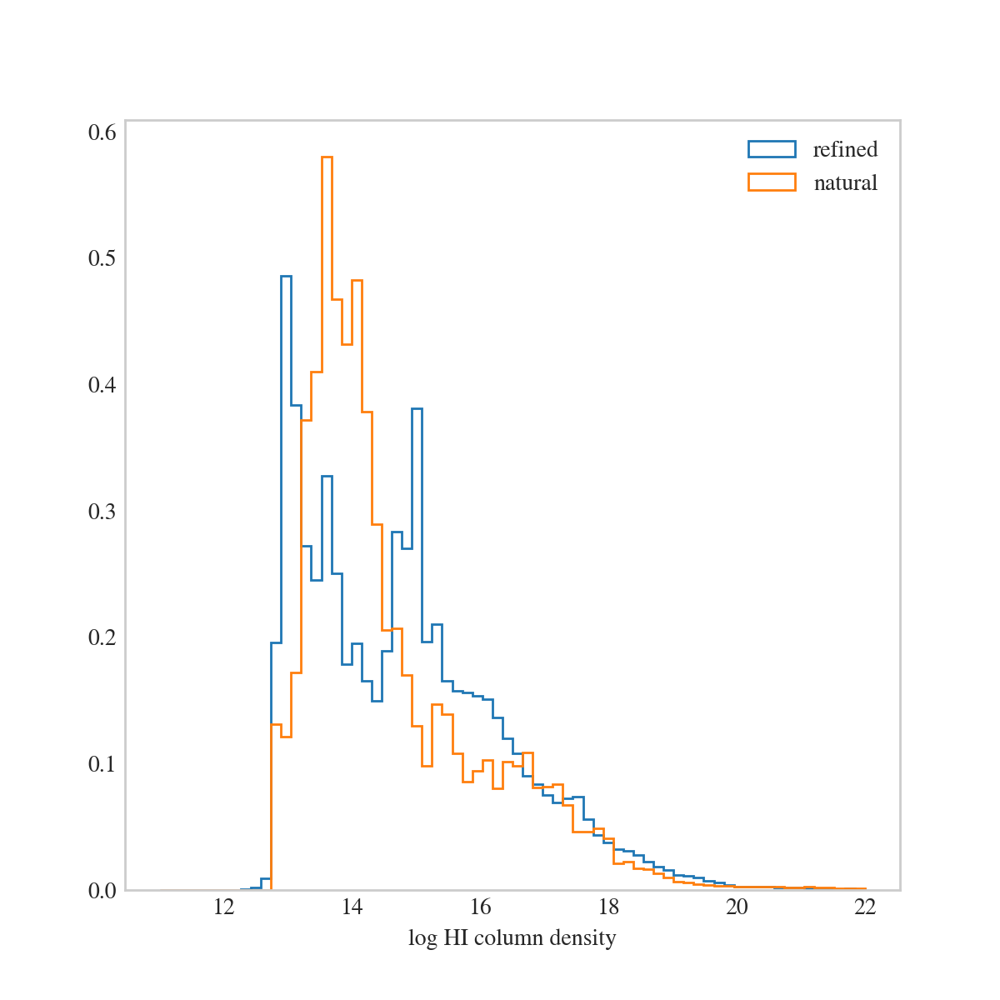

Text(0.5,0,u'log HI column density')

In [111]:
hicolr = np.sort(np.array(frbr['H_p0_number_density']).ravel())
hicoln = np.sort(np.array(frbn['H_p0_number_density']).ravel())
print np.min(hicolr), np.min(hicoln)
print np.max(hicolr), np.max(hicoln)
print len(hicolr), len(hicoln)
fig = plt.figure(figsize=(6,6))
ax1 = fig.add_subplot(111)
ax1.hist(np.log10(hicolr),bins=70,histtype='step',range=[11,22],normed=True, label="refined")
ax1.hist(np.log10(hicoln),bins=70,histtype='step',range=[11,22],normed=True, label="natural")
plt.legend()
plt.xlabel('log HI column density')

In [177]:
from scipy import stats
stats.ks_2samp(hicolr, hicoln)

Ks_2sampResult(statistic=0.15829687499999995, pvalue=0.0)

<IPython.core.display.Javascript object>


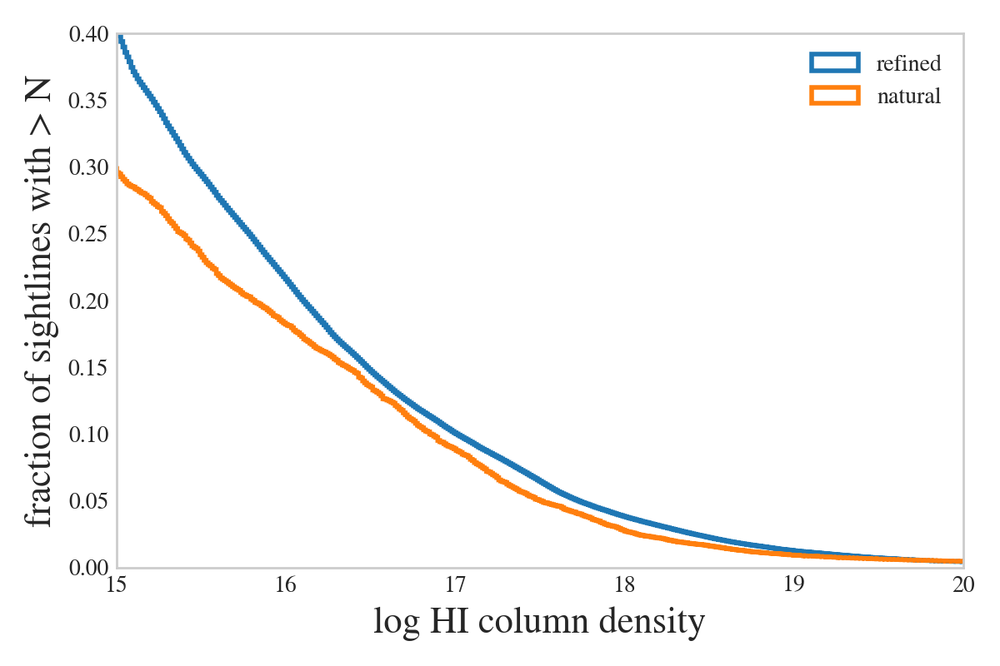

In [157]:
fig = plt.figure(figsize=(6,4))
ax1 = fig.add_subplot(111)
ax1.hist(np.log10(hicolr),bins=1000,histtype='step',range=[12,24],normed=True,cumulative=-1,label="refined",lw=2)
ax1.hist(np.log10(hicoln),bins=1000,histtype='step',range=[12,24],normed=True,cumulative=-1,label="natural",lw=2)
plt.xlim(15,20)
plt.ylim(0,0.4)
plt.legend(loc = 'upper right')
plt.xlabel('log HI column density',fontsize=16)
plt.ylabel('fraction of sightlines with > N',fontsize=16)
plt.tight_layout()
plt.savefig('HI_covering_fractions_strong.png')

<IPython.core.display.Javascript object>


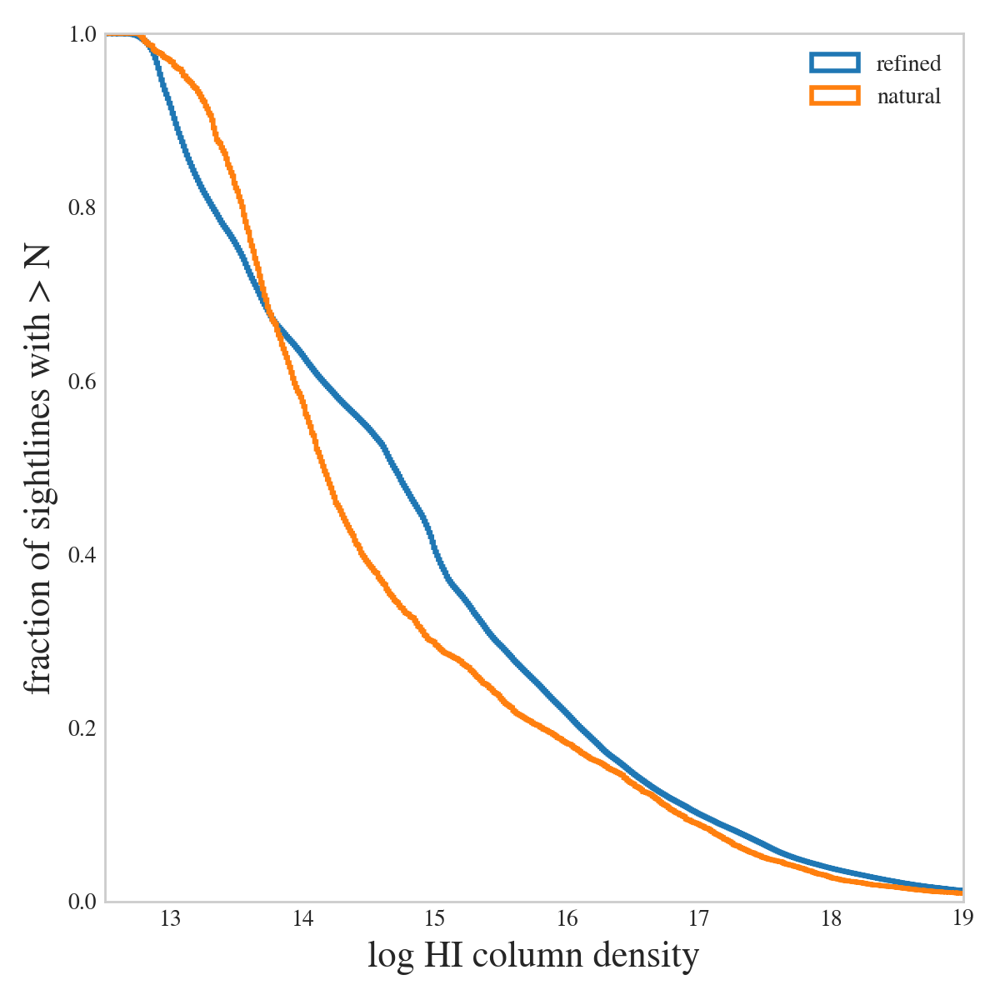

In [155]:
fig = plt.figure(figsize=(6,6))
ax1 = fig.add_subplot(111)
ax1.hist(np.log10(hicolr),bins=1000,histtype='step',range=[12,24],normed=True,cumulative=-1,label="refined",lw=2)
ax1.hist(np.log10(hicoln),bins=1000,histtype='step',range=[12,24],normed=True,cumulative=-1,label="natural",lw=2)
plt.xlim(12.5,19)
plt.ylim(0,1)
plt.legend(loc = 'upper right')
plt.xlabel('log HI column density',fontsize=16)
plt.ylabel('fraction of sightlines with > N',fontsize=16)
plt.tight_layout()
plt.savefig('HI_covering_fractions.png')

yt : [INFO     ] 2018-06-23 15:22:50,415 Projection completed
yt : [INFO     ] 2018-06-23 15:22:50,423 xlim = 0.501263 0.503035
yt : [INFO     ] 2018-06-23 15:22:50,425 ylim = 0.493145 0.494917
yt : [INFO     ] 2018-06-23 15:22:50,427 xlim = 0.501263 0.503035
yt : [INFO     ] 2018-06-23 15:22:50,428 ylim = 0.493145 0.494917
yt : [INFO     ] 2018-06-23 15:22:50,430 Making a fixed resolution buffer of (('gas', 'Si_p2_number_density')) 800 by 800



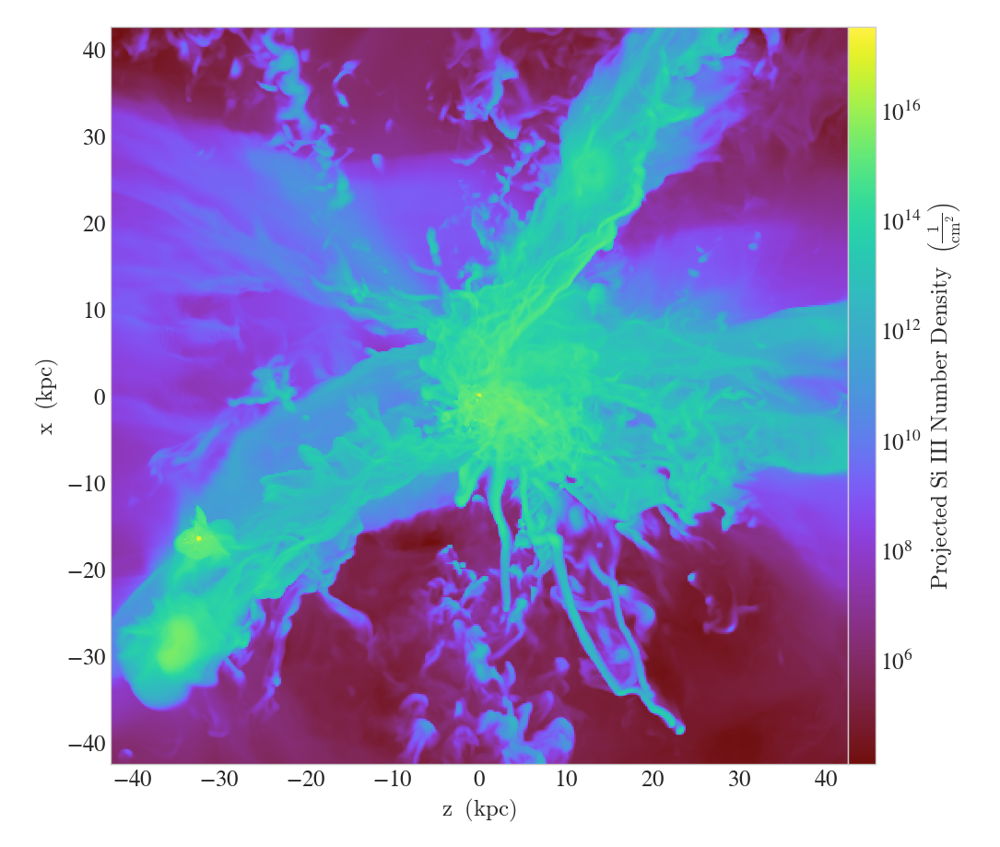

In [158]:
pr = yt.ProjectionPlot(dsr, 'y', ('gas','Si_p2_number_density'), center=centerr, data_source=refine_box, width=(width,'kpc'))
pr.show()
frbs3r = pr.frb

yt : [INFO     ] 2018-06-23 15:22:53,975 Projection completed
yt : [INFO     ] 2018-06-23 15:22:53,977 xlim = 0.501268 0.503040
yt : [INFO     ] 2018-06-23 15:22:53,978 ylim = 0.493147 0.494919
yt : [INFO     ] 2018-06-23 15:22:53,981 xlim = 0.501268 0.503040
yt : [INFO     ] 2018-06-23 15:22:53,983 ylim = 0.493147 0.494919
yt : [INFO     ] 2018-06-23 15:22:53,985 Making a fixed resolution buffer of (('gas', 'Si_p2_number_density')) 800 by 800



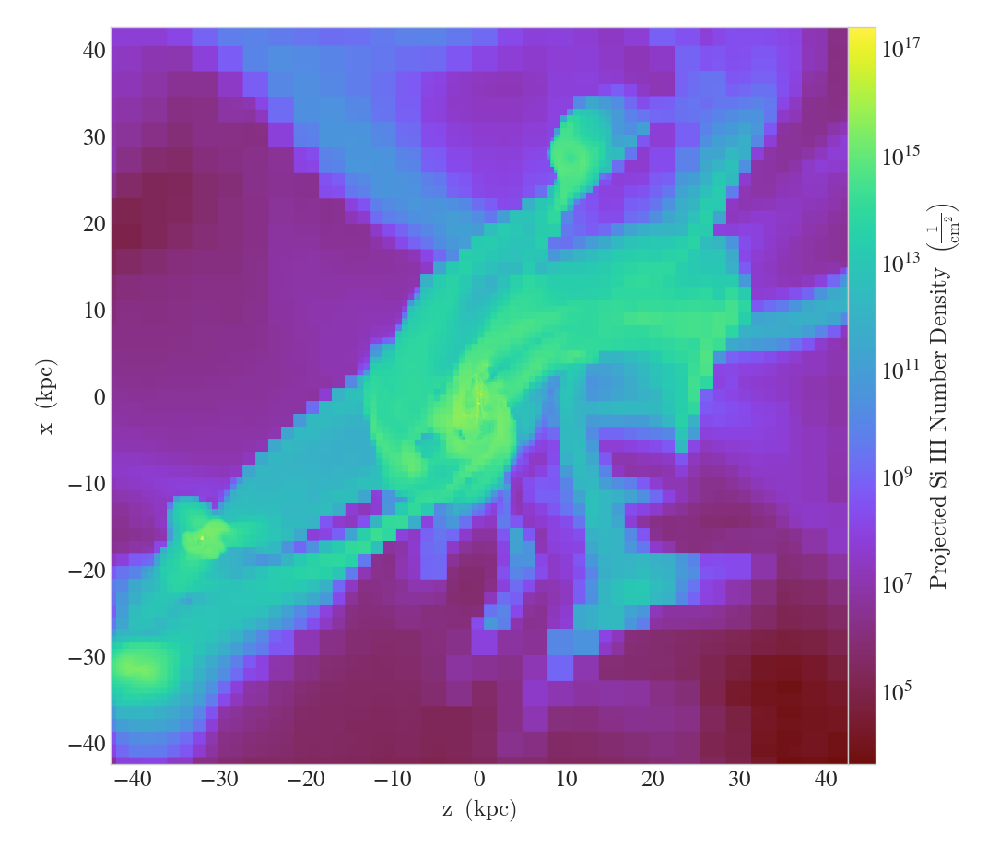

In [159]:
pn = yt.ProjectionPlot(dsn, 'y', ('gas','Si_p2_number_density'), center=center, data_source=refine_box_natural, width=(width,'kpc'))
pn.show()
frbs3n = pn.frb

<IPython.core.display.Javascript object>


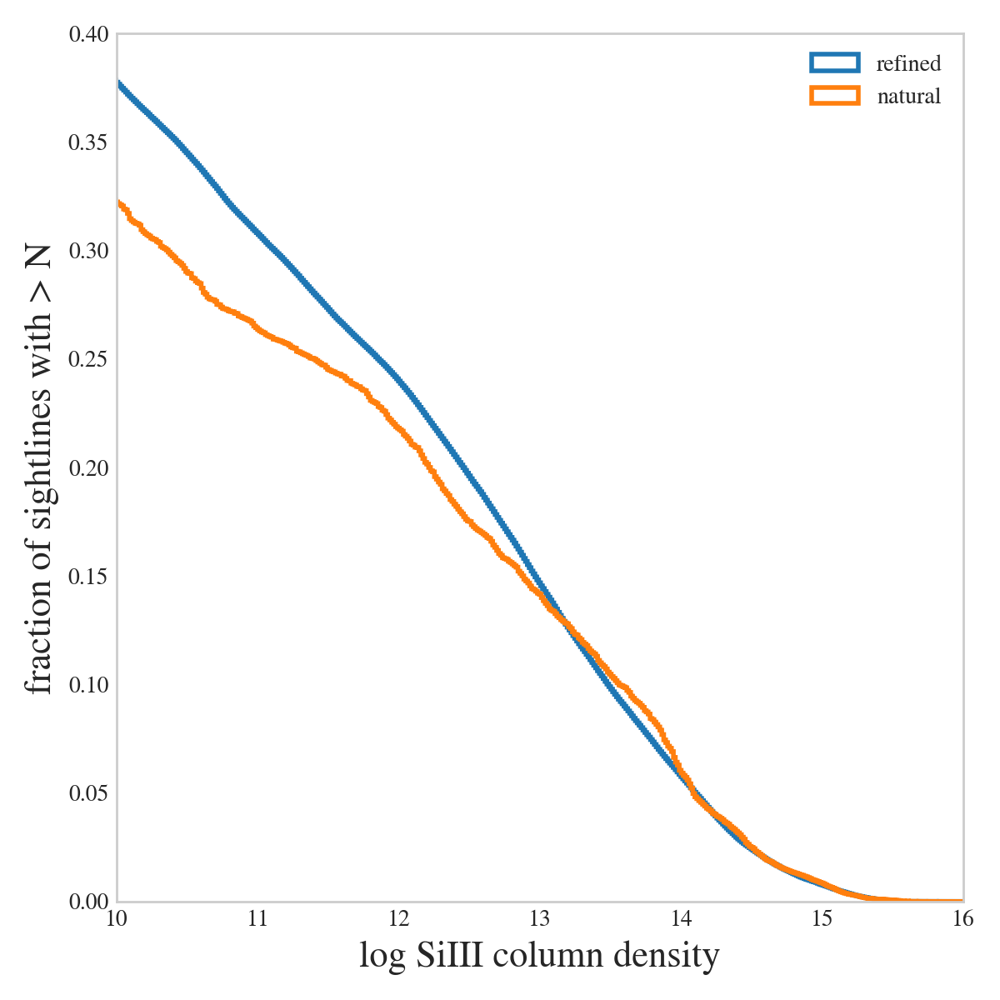

In [163]:
hicolr = np.sort(np.array(frbr['H_p0_number_density']).ravel())
hicoln = np.sort(np.array(frbn['H_p0_number_density']).ravel())
si3colr = np.sort(np.array(frbs3r['Si_p2_number_density']).ravel())
si3coln = np.sort(np.array(frbs3n['Si_p2_number_density']).ravel())
fig = plt.figure(figsize=(6,6))
ax1 = fig.add_subplot(111)
ax1.hist(np.log10(si3colr),bins=1000,histtype='step',normed=True,cumulative=-1,label="refined",lw=2)
ax1.hist(np.log10(si3coln),bins=1000,histtype='step',normed=True,cumulative=-1,label="natural",lw=2)
plt.xlim(10,16)
plt.ylim(0,0.4)
plt.legend(loc = 'upper right')
plt.xlabel('log SiIII column density',fontsize=16)
plt.ylabel('fraction of sightlines with > N',fontsize=16)
plt.tight_layout()

<IPython.core.display.Javascript object>


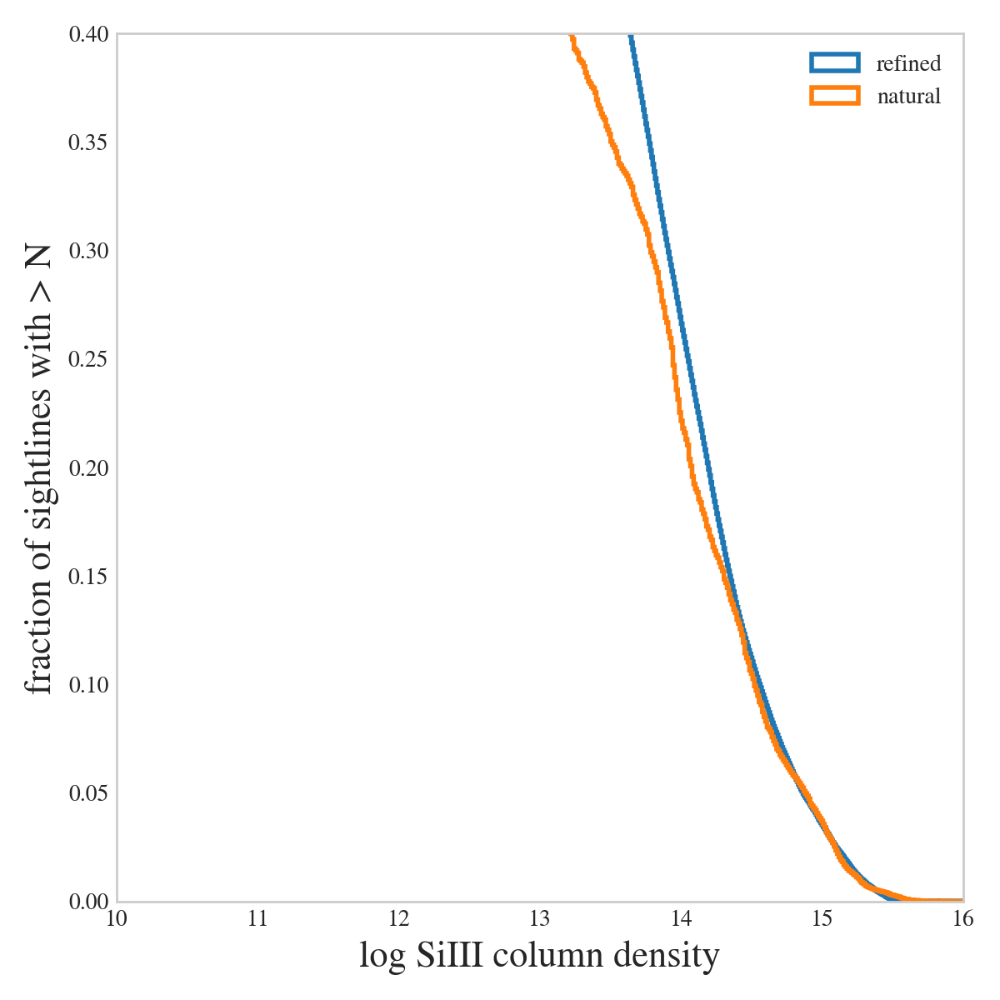

In [164]:
hicolur = np.array(frbr['H_p0_number_density']).ravel()
hicolun = np.array(frbn['H_p0_number_density']).ravel()
si3colur = np.array(frbs3r['Si_p2_number_density']).ravel()
si3colun = np.array(frbs3n['Si_p2_number_density']).ravel()

idn = np.where(hicolun > 1.e16)
idr = np.where(hicolur > 1.e16)

fig = plt.figure(figsize=(6,6))
ax1 = fig.add_subplot(111)
ax1.hist(np.log10(si3colur[idr]),bins=1000,histtype='step',normed=True,cumulative=-1,label="refined",lw=2)
ax1.hist(np.log10(si3colun[idr]),bins=1000,histtype='step',normed=True,cumulative=-1,label="natural",lw=2)
plt.xlim(10,16)
plt.ylim(0,0.4)
plt.legend(loc = 'upper right')
plt.xlabel('log SiIII column density',fontsize=16)
plt.ylabel('fraction of sightlines with > N',fontsize=16)
plt.tight_layout()

<IPython.core.display.Javascript object>


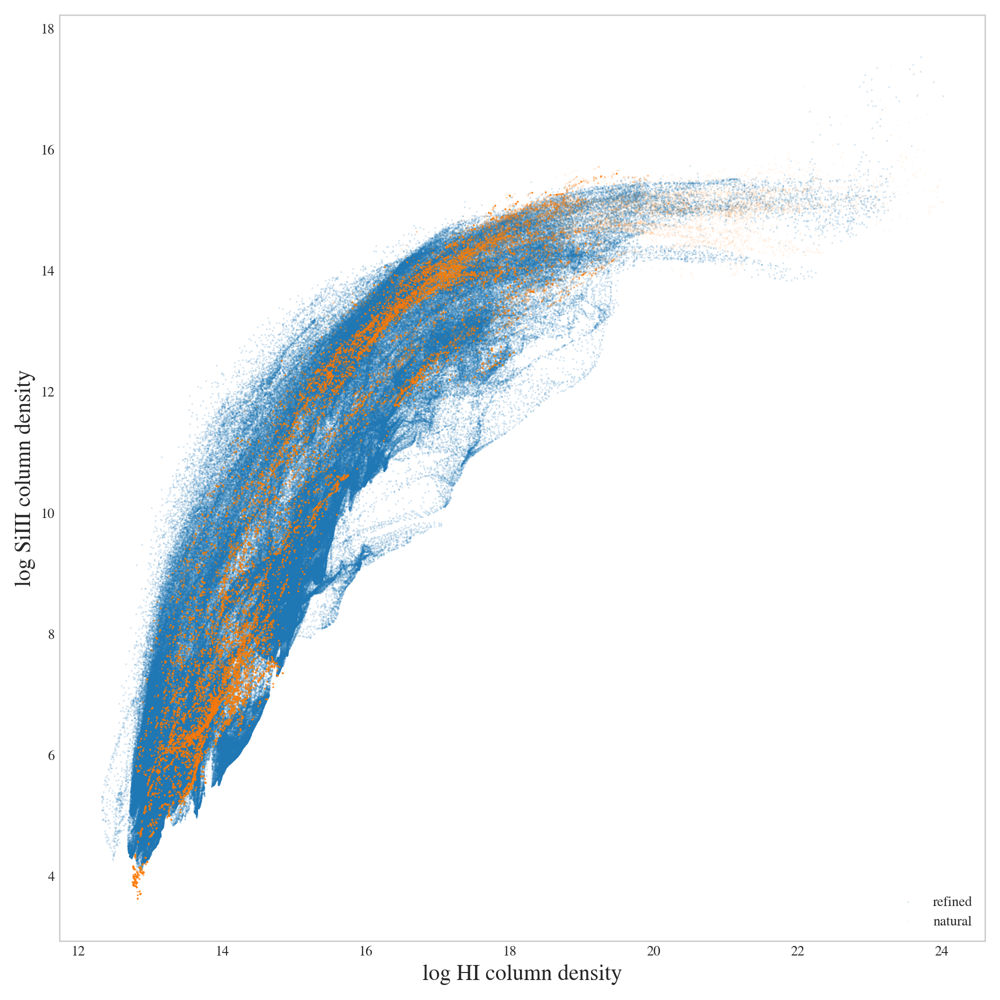

In [180]:

fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(111)
ax1.scatter(np.log10(hicolur),np.log10(si3colur),label="refined", s=0.1, marker='.', alpha=0.5)
ax1.scatter(np.log10(hicolun),np.log10(si3colun),label="natural", s=0.1, marker='.', alpha=0.2)
#plt.xlim(10,16)
#plt.ylim(0,0.4)
plt.legend(loc = 'lower right')
plt.xlabel('log HI column density',fontsize=16)
plt.ylabel('log SiIII column density',fontsize=16)
plt.tight_layout()